In [1]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import roc_auc_score, make_scorer
import shap
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Original Data

In [2]:
df_original = pd.read_csv('original_outcome_data.csv')

df_original['Original_outcome'] = df_original['Original_outcome'].astype('category')
df_original['Q6_version'] = df_original['Q6_version'].astype('category')
df_original = pd.get_dummies(df_original, columns=['Q6_version'], drop_first=True)

X_original = df_original.drop(['Original_outcome'], axis=1)
y_original= df_original['Original_outcome'].cat.codes 


In [3]:
# no course final score
df_original = pd.read_csv('original_outcome_data.csv')

df_original['Original_outcome'] = df_original['Original_outcome'].astype('category')
df_original['Q6_version'] = df_original['Q6_version'].astype('category')
df_original = pd.get_dummies(df_original, columns=['Q6_version'], drop_first=True)

X_original = df_original.drop(['Original_outcome','course_final_score'], axis=1)
y_original= df_original['Original_outcome'].cat.codes 

In [18]:
from statistics import mode
X_train["fracLong_log"].mean()

0.5617860569024435

In [3]:
X_original

,long_similar,long_identical,is_similar,is_identical,midterm_exam_1,nPracticed_log,medTime_correct_log,med_lead_to_Exam_log,last_practice_to_Exam_log,fracLong_log,frac_correct_std,Q6_version_V2
0,True,False,True,False,3,2.197225,0.000000,0.869665,0.842166,0.405465,-0.581553,0
1,False,False,False,False,5,1.098612,0.000000,3.862418,3.862418,0.693147,-0.581553,1
2,True,True,True,True,4,2.708050,6.388561,2.683055,1.213345,0.536493,1.713017,0
3,True,False,True,False,6,2.397895,6.460687,1.365737,0.980829,0.470004,0.703406,0
4,True,False,True,False,8,2.944439,8.373323,2.698804,1.071869,0.576613,-0.224620,1
...,...,...,...,...,...,...,...,...,...,...,...,...
154,True,False,True,False,7,2.564949,7.620950,2.982520,1.164365,0.693147,0.489247,0
155,False,False,False,False,6,1.098612,0.000000,3.758133,3.758133,0.693147,-0.581553,1
156,False,False,False,False,3,1.098612,0.000000,3.771023,3.771023,0.693147,-0.581553,1
157,False,False,False,False,1,1.098612,0.000000,0.985506,0.985506,0.693147,-0.581553,1


In [4]:
X_train, X_test, y_train, y_test = train_test_split(X_original, y_original, test_size=0.2, random_state=42)

### CART

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best parameters found:  {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 2}
Best AUC score:  0.7119047619047618
AUC Score on test set: 0.6450980392156863


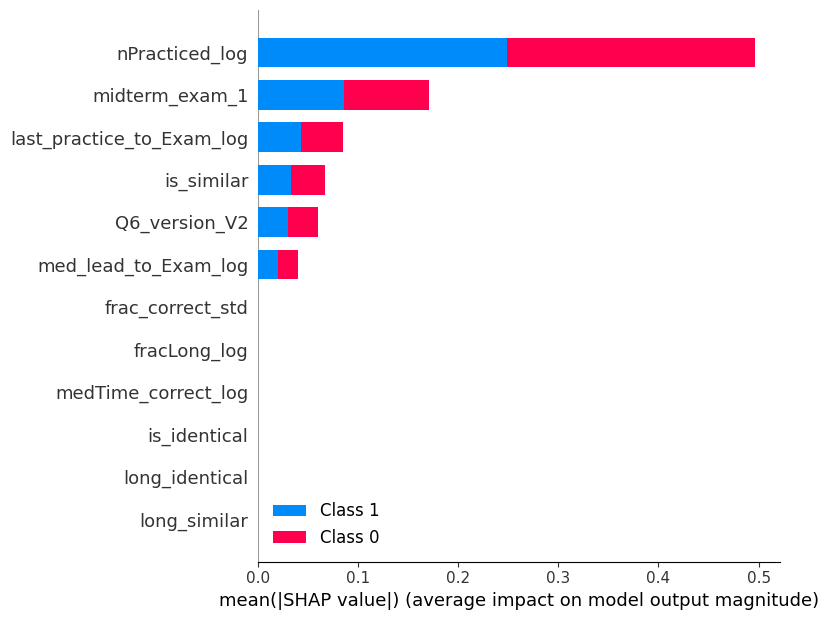

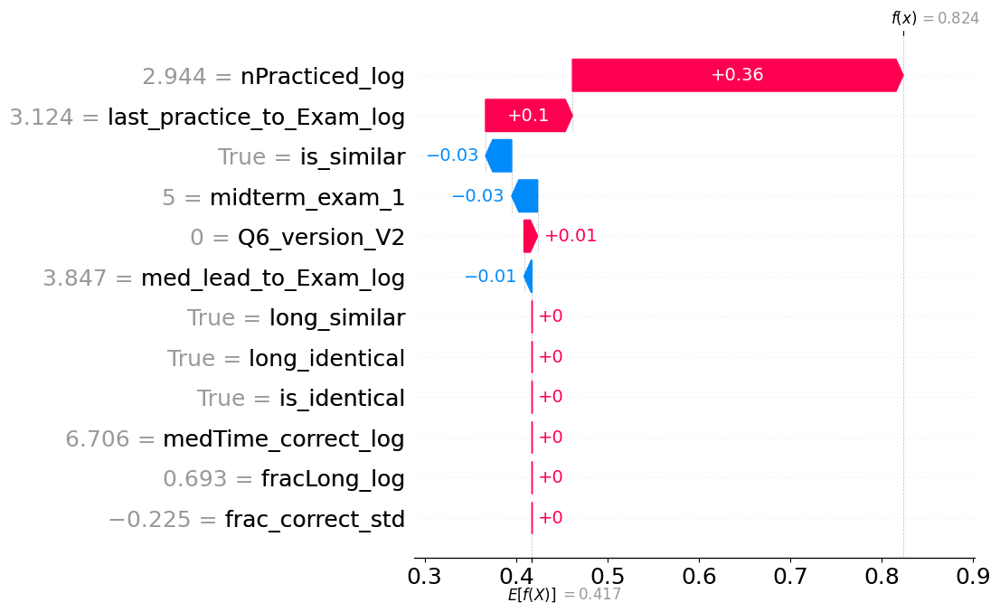

In [24]:
# Define the parameters for the CART model
from sklearn.tree import DecisionTreeClassifier
cart_model = DecisionTreeClassifier(random_state=42)

# Define the grid of parameters to search
# Define the parameter grid for tuning
param_grid = {
    'criterion': ['gini', 'entropy'],  # Split quality criteria
    'max_depth': [None, 5, 10, 15, 20],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 5, 10]  # Minimum number of samples required to be at a leaf node
}


# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=cart_model,
    param_grid=param_grid,
    scoring='roc_auc',  # Optimize for AUC
    cv=5,  # 5-fold cross-validation
    verbose=1,
    n_jobs=-1  # Use all available cores
)


# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
best_cart_model = grid_search.best_estimator_
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
explainer = shap.TreeExplainer(best_cart_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# # Plot individual SHAP values
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[0, :], X_test.iloc[0, :])

ax = plt.gca()
# Plot waterfall plot without limiting the number of displayed features
instance_index = 0  # Specify the instance you want to plot

shap.plots.waterfall(
    shap.Explanation(values=shap_values[1][instance_index],  # Use shap_values[1] for the positive class
                     base_values=explainer.expected_value[1],  # Use expected value for the positive class
                     data=X_test.iloc[instance_index],  # The data for the instance
                     feature_names=X_test.columns),  # The feature names
    max_display=len(X_test.columns),  # Display all features
    show=False  # Don't show immediately to allow for further customization
)

# shap.plots.waterfall(shap.Explanation(values=shap_values[0,:],
#                                       base_values=explainer.expected_value,
#                                       data=X_test.iloc[0],
#                                       feature_names=X_test.columns),
#                      max_display=len(X_test.columns),
#                      show = False)
# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# # Show the adjusted plot
# plt.savefig('xgb_transfer_shap_waterfall_onlyexam1.svg', format='svg')
plt.show()

### Logistic Regression

AUC Score on test set: 0.6509803921568629


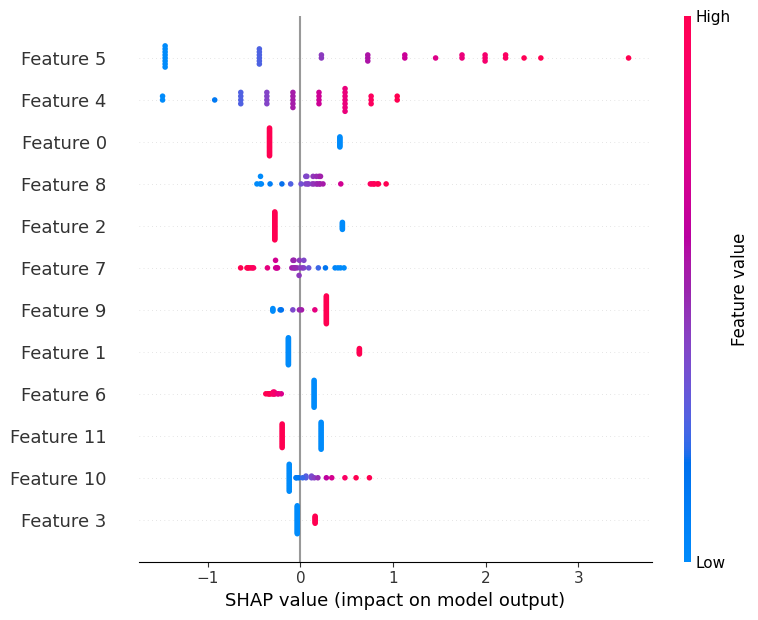

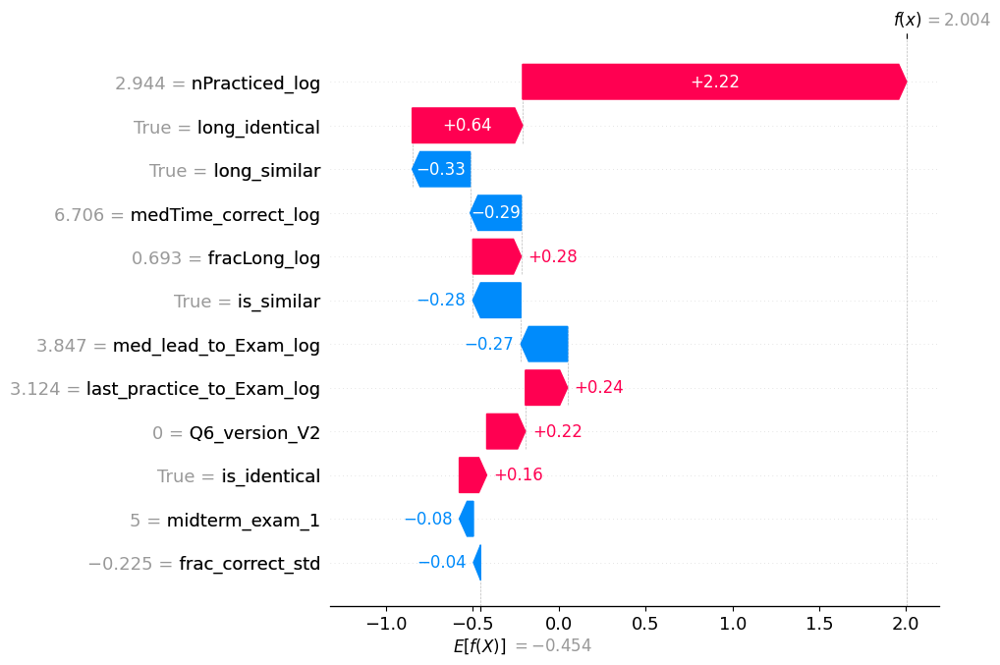

In [5]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train logistic regression model
log_reg = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
log_reg.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = log_reg.predict_proba(X_test_scaled)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
explainer = shap.Explainer(log_reg, X_train_scaled)

# Calculate SHAP values
shap_values = explainer(X_test_scaled)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values for a single instance
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values.values[0, :], X_test.iloc[0, :])

# Plot waterfall plot with all features displayed
shap.waterfall_plot(shap.Explanation(values=shap_values.values[0],
                                      base_values=explainer.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                    max_display=len(X_test.columns))

AUC Score on test set: 0.6509803921568629


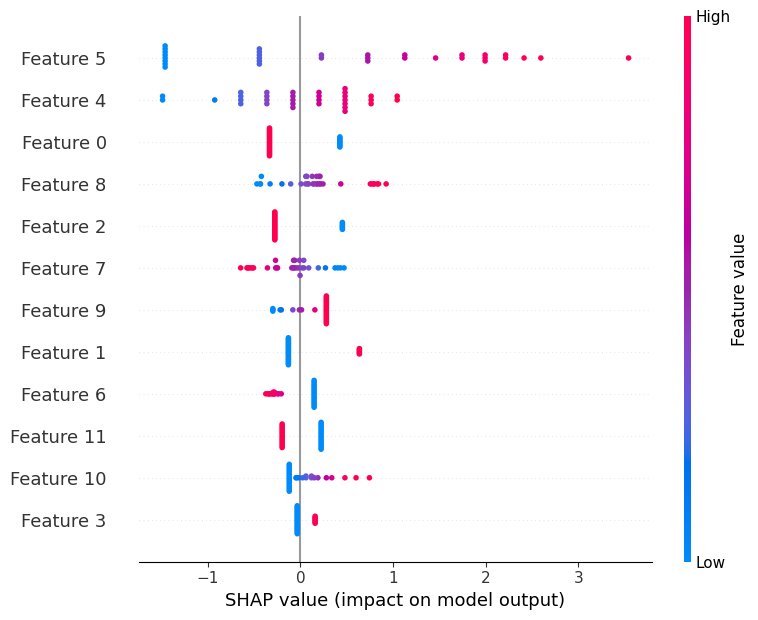

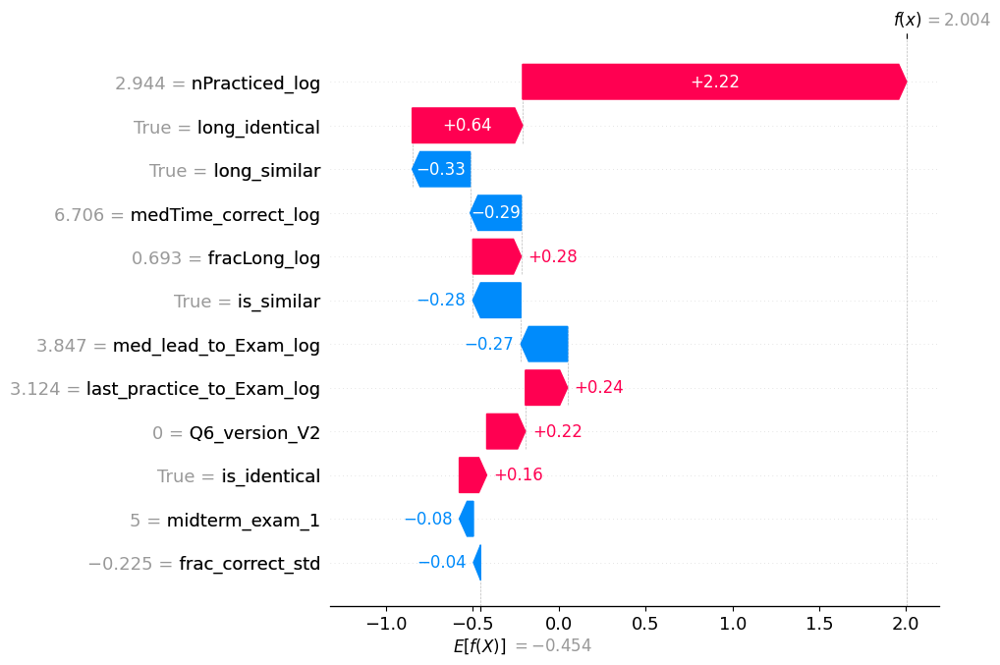

In [5]:
# no final score
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train logistic regression model
log_reg = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
log_reg.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = log_reg.predict_proba(X_test_scaled)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
explainer = shap.Explainer(log_reg, X_train_scaled)

# Calculate SHAP values
shap_values = explainer(X_test_scaled)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values for a single instance
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values.values[0, :], X_test.iloc[0, :])

# Plot waterfall plot with all features displayed
shap.waterfall_plot(shap.Explanation(values=shap_values.values[0],
                                      base_values=explainer.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                    max_display=len(X_test.columns))



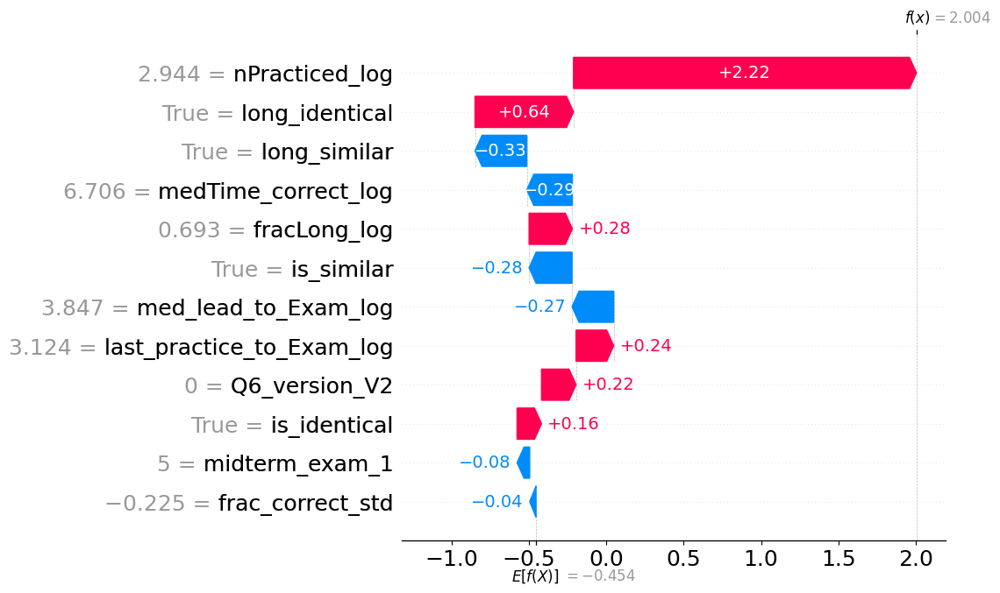

In [6]:
# Access current axes
ax = plt.gca()
# Create the waterfall plot
shap.waterfall_plot(shap.Explanation(values=shap_values.values[0],
                                     base_values=explainer.expected_value,
                                     data=X_test.iloc[0],
                                     feature_names=X_test.columns),
                    max_display=len(X_test.columns),
                    show=False
                    )

# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# Show the adjusted plot
plt.show()


In [6]:
# Compute SHAP interaction values
shap_interaction_values = explainer.shap_interaction_values(X_train_scaled)
# SHAP Dependence Plot with interaction
shap.dependence_plot((0, 1), shap_interaction_values, X_train_scaled)  # Example: interaction between feature 0 and 1


AttributeError: 'LinearExplainer' object has no attribute 'shap_interaction_values'

## XGBoost

Fitting 5 folds for each of 2187 candidates, totalling 10935 fits


[CV 1/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=150, subsample=0.6;, score=0.788 total time=   0.1s
[CV 4/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=100, subsample=0.6;, score=0.740 total time=   0.0s
[CV 5/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=100, subsample=0.6;, score=0.682 total time=   0.0s
[CV 1/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=100, subsample=0.8;, score=0.830 total time=   0.0s
[CV 1/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, subsample=1;, score=0.764 total time=   0.1s
[CV 5/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, subsample=1;, score=0.526 total time=   0.1s
[CV 4/5] END colsample_bytree=0.

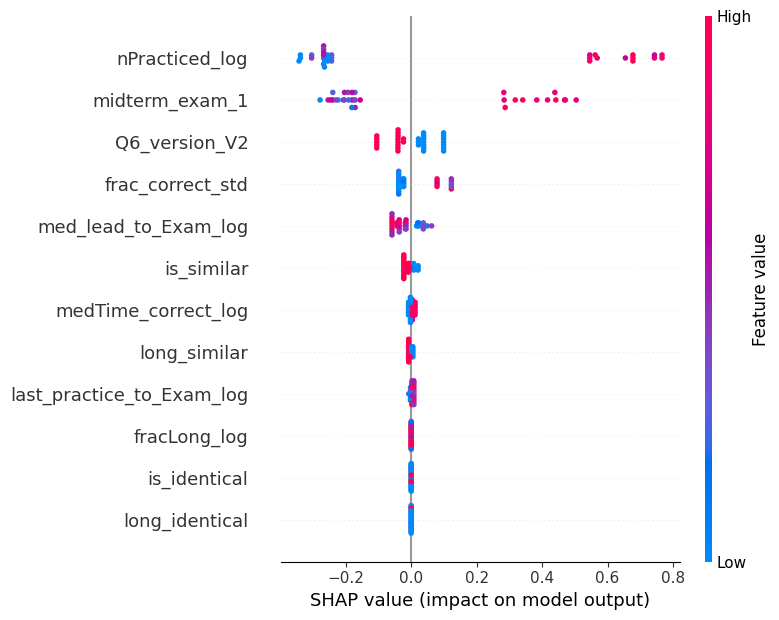

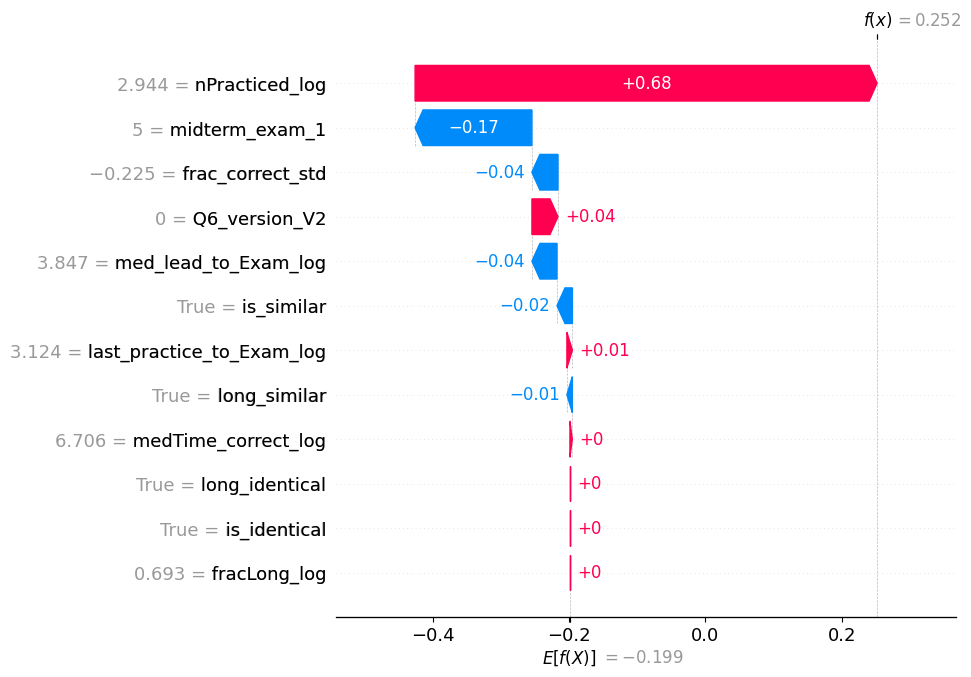

In [7]:
# Define the parameters for the xgboost model
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    nthread=2,
    verbosity=1
)

# Define the grid of parameters to search
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [4, 6, 8],
    'learning_rate': [0.01, 0.1, 0.3],
    'gamma': [0, 1, 5],
    'colsample_bytree': [0.6, 0.8, 1],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1]
}

# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    verbose=3,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
best_model = grid_search.best_estimator_
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0, :], X_test.iloc[0, :])

# Plot waterfall plot without limiting the number of displayed features
shap.plots.waterfall(shap.Explanation(values=shap_values[0],
                                      base_values=explainer.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=len(X_test.columns))

Fitting 5 folds for each of 2187 candidates, totalling 10935 fits


[CV 1/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=50, subsample=1;, score=0.739 total time=   0.2s
[CV 2/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=50, subsample=0.8;, score=0.752 total time=   0.2s
[CV 3/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=50, subsample=0.6;, score=0.613 total time=   0.2s
[CV 1/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, subsample=0.6;, score=0.782 total time=   0.1s
[CV 1/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=50, subsample=0.8;, score=0.788 total time=   0.2s
[CV 1/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=150, subsample=0.6;, score=0.788 total time=   0.3s[CV 1/5] END colsample_bytree=0.6, 

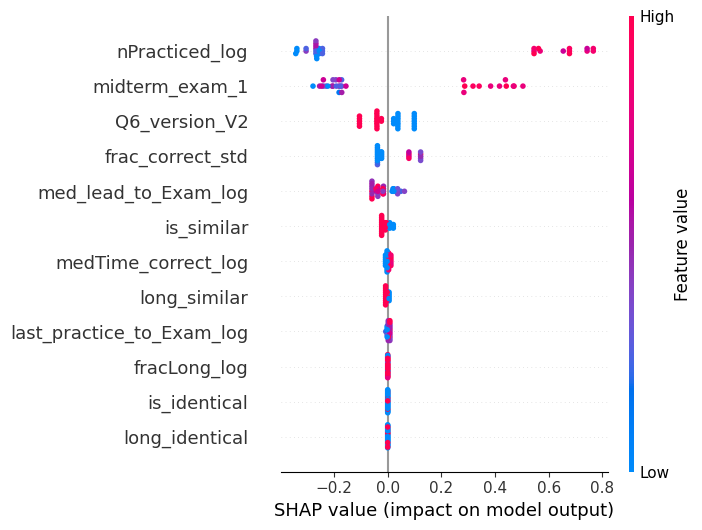

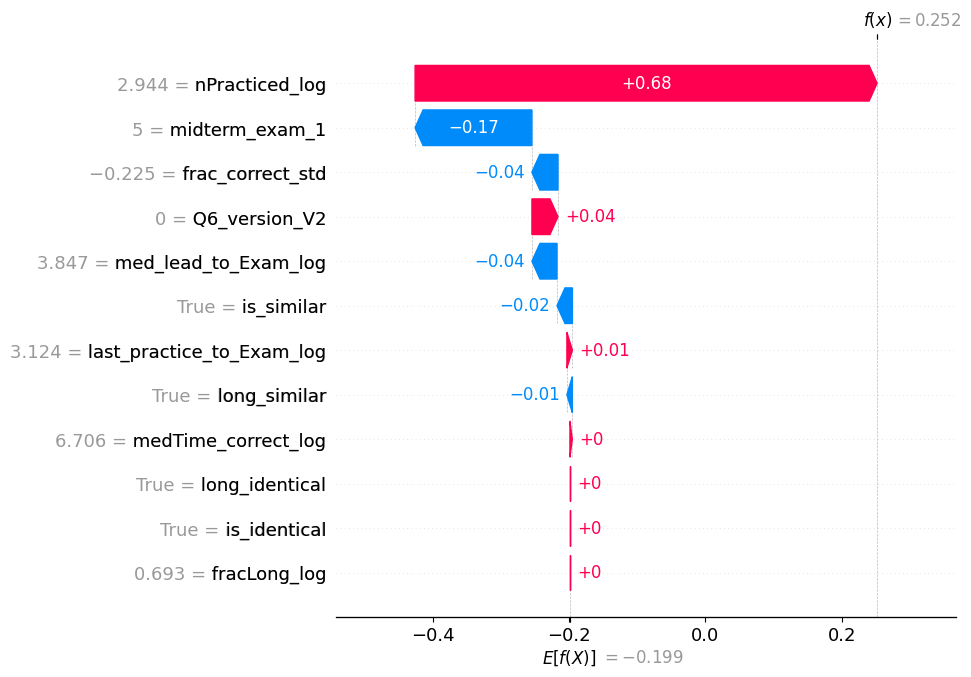

In [25]:
# no final score
# Define the parameters for the xgboost model
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    nthread=2,
    verbosity=1
)

# Define the grid of parameters to search
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [4, 6, 8],
    'learning_rate': [0.01, 0.1, 0.3],
    'gamma': [0, 1, 5],
    'colsample_bytree': [0.6, 0.8, 1],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1]
}

# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    verbose=3,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
best_model = grid_search.best_estimator_
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0, :], X_test.iloc[0, :])

# Plot waterfall plot without limiting the number of displayed features
shap.plots.waterfall(shap.Explanation(values=shap_values[0],
                                      base_values=explainer.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=len(X_test.columns))

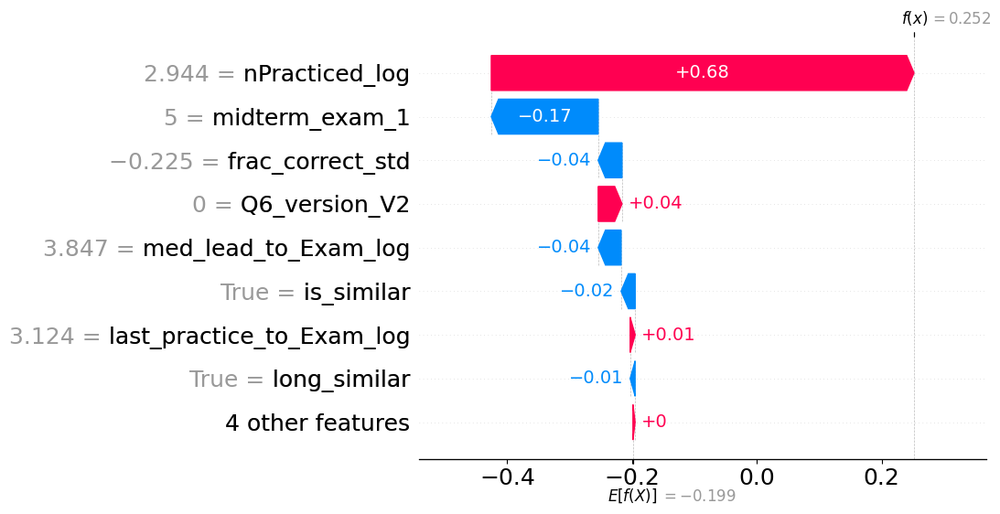

In [36]:
# Access current axes
ax = plt.gca()
# Create the waterfall plot
# shap.waterfall_plot(shap.Explanation(values=shap_values.values[0],
#                                      base_values=explainer.expected_value,
#                                      data=X_test.iloc[0],
#                                      feature_names=X_test.columns),
#                     max_display=len(X_test.columns),
#                     show=False
#                     )
# Plot waterfall plot without limiting the number of displayed features
shap.plots.waterfall(shap.Explanation(values=shap_values[0],
                                      base_values=explainer.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=9,
                     show = False)

# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# Show the adjusted plot
plt.show()

In [ ]:
# Compute SHAP interaction values
shap_interaction_values = explainer.shap_interaction_values(X_test)
# SHAP Dependence Plot with interaction
shap.dependence_plot((0, 1), shap_interaction_values, X_test)  # Example: interaction between feature 0 and 1

### Random Forest

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 3/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.560 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.693 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.794 total time=   0.2s
[CV 2/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.697 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.597 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100;, score=0.776 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=

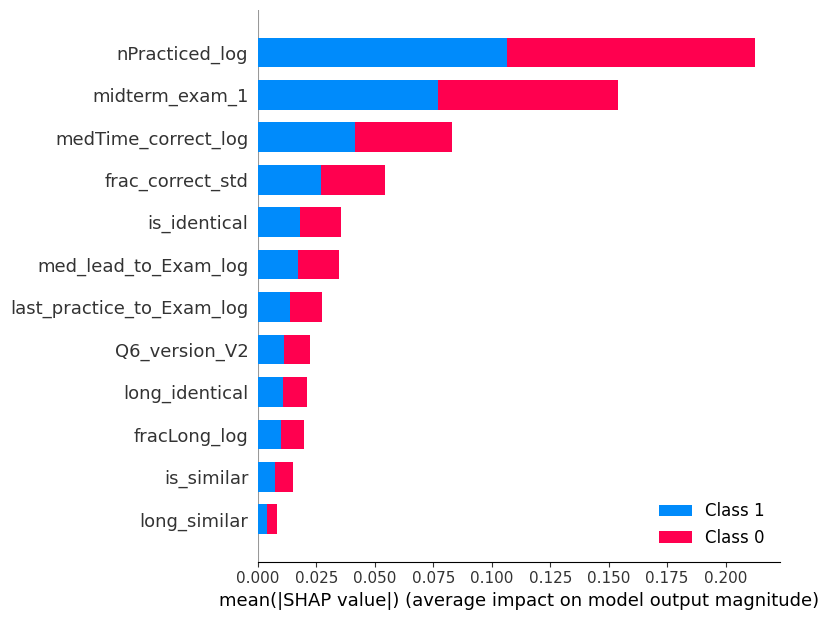

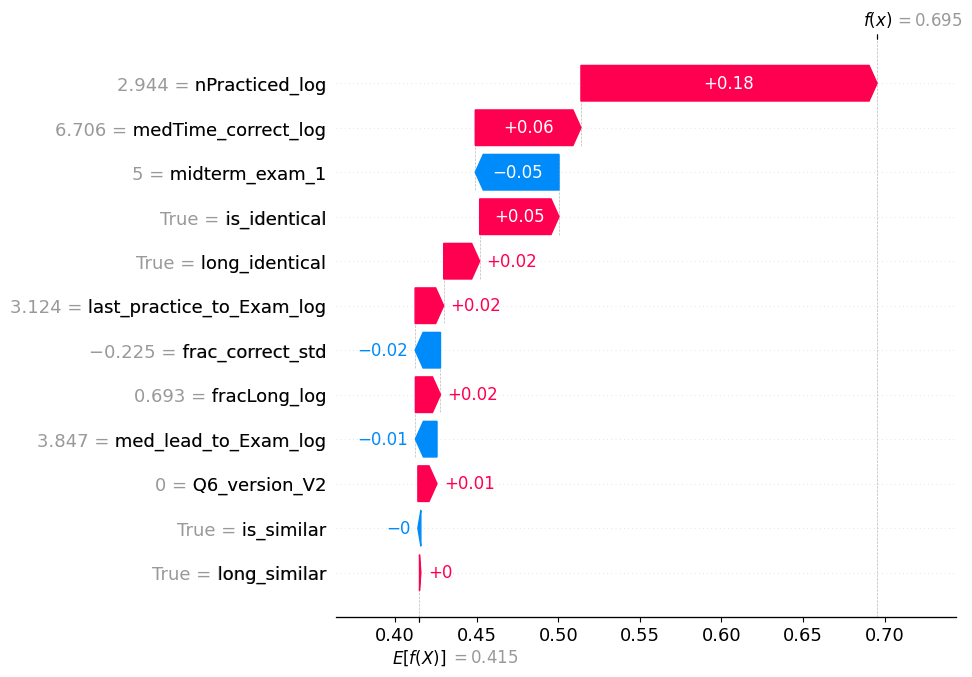

In [7]:
# Define the grid of parameters to search
param_grid = {
    'n_estimators': [100],  # Number of trees in the forest
    'max_features': ['sqrt', 'log2', None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(),
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    verbose=3,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
best_model = grid_search.best_estimator_
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0, :], X_test.iloc[0, :])

# Plot waterfall plot with all features displayed
shap.waterfall_plot(shap.Explanation(values=shap_values[1][0],
                                      base_values=explainer.expected_value[1],
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=len(X_test.columns))

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50;, score=0.652 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50;, score=0.520 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200;, score=0.693 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.685 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50;, score=0.627 total time=   0.1s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50;, score=0.648 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.660 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.540 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.571 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200;, score=0.552 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200;, score=0.520 total time=   0.2s
[CV 3/5] END bootstrap=True,

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200;, score=0.679 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.733 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.597 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.620 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50;, score=0.617 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.507 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200;, score=0.578 total time=   0.4s
[CV 2/5] END bootstrap=True

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.707 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.603 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.770 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.527 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200;, score=0.764 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.764 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200;, score=0.667 total time=   0.4s
[CV 3/5] END bootstrap=Tr

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200;, score=0.547 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200;, score=0.745 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.758 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.764 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.640 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.733 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.584 total time=   0.2s
[CV 3/5] END bootstr

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500;, score=0.776 total time=   0.8s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.721 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500;, score=0.527 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.660 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=200;, score=0.591 total time=   0.4s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=500;, score=0.707 total time=   0.8s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=200;, score=0.770 total time=   0.4s
[CV 2/5] END bootstrap=T

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=500;, score=0.558 total time=   1.0s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.727 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.758 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.733 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.540 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.604 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.667 total time=   0.3s
[CV 5/5] END bootstrap=True, ma

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=500;, score=0.720 total time=   0.9s[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=500;, score=0.591 total time=   0.9s

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=500;, score=0.567 total time=   1.0s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=500;, score=0.782 total time=   1.0s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200;, score=0.640 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100;, score=0.604 total time=   0.3s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50;, score=0.770 total time=   0.1s
[CV 2/5] END bootstrap=

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200;, score=0.571 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.745 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200;, score=0.547 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=500;, score=0.758 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=500;, score=0.753 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.693 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.553 total time=   0.2s
[CV 5/5] END bootstrap

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=50;, score=0.587 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=50;, score=0.687 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000;, score=0.680 total time=   1.6s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=50;, score=0.591 total time=   0.1s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=0.752 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=0.770 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200;, score=0.553 total time=   0.4s
[CV 3/5] END bootstrap

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000;, score=0.758 total time=   1.9s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000;, score=0.584 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000;, score=0.513 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.600 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000;, score=0.642 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000;, score=0.513 total time=   1.8s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000;, score=0.745 total time=   1.8s
[CV 4/5] END bootst

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=1000;, score=0.567 total time=   1.8s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.533 total time=   1.0s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.597 total time=   0.9s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=200;, score=0.758 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=200;, score=0.567 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500;, score=0.567 total time=   0.7s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=200;, score=0.707 total time=   0.4s
[CV 5/5] END bootstra

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50;, score=0.623 total time=   0.1s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500;, score=0.752 total time=   0.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500;, score=0.752 total time=   0.9s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500;, score=0.591 total time=   0.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=200;, score=0.745 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100;, score=0.776 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500;, score=0.713 total time=   0.9s
[CV 1/5] END bootstrap=

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50;, score=0.770 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50;, score=0.727 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50;, score=0.687 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=1000;, score=0.758 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=1000;, score=0.573 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50;, score=0.580 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50;, score=0.623 total time=   0.1s
[CV 1/5] END bootstrap=True,

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000;, score=0.703 total time=   1.8s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000;, score=0.764 total time=   1.9s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=500;, score=0.584 total time=   0.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=500;, score=0.752 total time=   0.9s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=500;, score=0.764 total time=   0.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=500;, score=0.580 total time=   0.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.745 total time=   0.2s
[CV 3/5] END bootstra

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100;, score=0.776 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100;, score=0.656 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100;, score=0.567 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100;, score=0.747 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.587 total time=   0.5s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=500;, score=0.776 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=500;, score=0.747 total time=   0.9s
[CV 3/5] END bootstra

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200;, score=0.764 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200;, score=0.620 total time=   0.4s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200;, score=0.630 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=100;, score=0.764 total time=   0.2s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=100;, score=0.745 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.720 total time=   0.9s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.770 total time=   1.0s
[CV 3/5] END bootstrap

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=1000;, score=0.567 total time=   1.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=1000;, score=0.707 total time=   1.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=100;, score=0.707 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=1000;, score=0.597 total time=   1.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=200;, score=0.733 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=100;, score=0.758 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=200;, score=0.607 total time=   0.4s
[CV 1/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500;, score=0.720 total time=   0.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.721 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.653 total time=   0.1s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.794 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=500;, score=0.593 total time=   1.0s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.740 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.643 total time=   0.1s
[CV 3/5] END bootstrap=True, max

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500;, score=0.758 total time=   1.0s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500;, score=0.567 total time=   0.9s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=1000;, score=0.584 total time=   1.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500;, score=0.713 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=200;, score=0.713 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=50;, score=0.782 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=50;, score=0.752 total time=   0.1s
[CV 3/5] END bootstrap=T

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest


[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.764 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=1000;, score=0.604 total time=   1.8s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.752 total time=   0.2s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=500;, score=0.752 total time=   0.9s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=500;, score=0.770 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.747 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100;, score=0.617 total time=   0.2s
[CV 3/5] END bootstrap

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.782 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1000;, score=0.567 total time=   1.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.752 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1000;, score=0.770 total time=   1.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1000;, score=0.752 total time=   1.9s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1000;, score=0.630 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=200;, score=0.620 total time=   0.4s
[CV 1/5] END bootstrap=

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000;, score=0.788 total time=   1.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.752 total time=   0.5s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000;, score=0.604 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000;, score=0.580 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=200;, score=0.613 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=200;, score=0.776 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=200;, score=0.745 total time=   0.4s
[CV 4/5] END bootstra

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.745 total time=   0.1s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.800 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.693 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1000;, score=0.643 total time=   1.8s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=15, n_estimators=200;, score=0.587 total time=   0.3s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.760 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.630 total time=   0.1s
[CV 1/5] END bootstrap=T

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=100;, score=0.713 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=100;, score=0.623 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.776 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.727 total time=   0.9s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.643 total time=   0.9s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=50;, score=0.794 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=50;, score=0.745 total time=   0.1s
[CV 1/5] END bootstrap=True

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=200;, score=0.782 total time=   0.4s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=200;, score=0.773 total time=   0.4s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=200;, score=0.617 total time=   0.4s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=1000;, score=0.610 total time=   1.9s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=200;, score=0.593 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100;, score=0.752 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100;, score=0.818 total time=   0.2s
[CV 3/5] END bootstra

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=1000;, score=0.620 total time=   1.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=1000;, score=0.745 total time=   1.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=15, n_estimators=500;, score=0.740 total time=   0.8s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=200;, score=0.794 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100;, score=0.824 total time=   0.2s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100;, score=0.733 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=200;, score=0.747 total time=   0.4s
[CV 3/5] END bootstrap

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=50;, score=0.818 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=50;, score=0.767 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=50;, score=0.770 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=50;, score=0.640 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=50;, score=0.623 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=1000;, score=0.633 total time=   1.8s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=1000;, score=0.752 total time=   1.9s
[CV 5/5] END bootstrap=Tr

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=500;, score=0.636 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=500;, score=0.760 total time=   0.9s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=50;, score=0.733 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=50;, score=0.593 total time=   0.1s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=50;, score=0.776 total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=50;, score=0.693 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=50;, score=0.649 total time=   0.1s
[CV 1/5] END bootstrap=Tr

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=200;, score=0.627 total time=   0.4s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=200;, score=0.727 total time=   0.4s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=500;, score=0.776 total time=   0.9s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=100;, score=0.740 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=100;, score=0.662 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=20, n_estimators=50;, score=0.788 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=500;, score=0.643 total time=   0.9s
[CV 2/5] END bootstrap=

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=1000;, score=0.633 total time=   1.8s
[CV 4/5] END bootstrap=True, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=1000;, score=0.740 total time=   1.8s
[CV 1/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=200;, score=0.764 total time=   0.4s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=20, n_estimators=100;, score=0.636 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=200;, score=0.643 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=200;, score=0.647 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=500;, score=0.745 total time=   0.9s
[CV 1/5] END bootst

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=True, max_features=None, min_samples_leaf=6, min_samples_split=15, n_estimators=1000;, score=0.740 total time=   1.8s
[CV 3/5] END bootstrap=True, max_features=None, min_samples_leaf=6, min_samples_split=15, n_estimators=1000;, score=0.640 total time=   1.8s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.621 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=200;, score=0.669 total time=   0.3s
[CV 1/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=200;, score=0.824 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=200;, score=0.739 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=None, min_samples_leaf=6, min_samples_split=15, n_estimators=1000;, score=0.745 total time=   1.9s
[CV 3/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50;, score=0.527 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50;, score=0.533 total time=   0.1s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.582 total time=   0.3s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50;, score=0.591 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.533 total time=   0.2s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.800 total time=   0.3s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.460 total time=   0.3s
[CV 5/5] END bootstrap=

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=None, min_samples_leaf=6, min_samples_split=20, n_estimators=1000;, score=0.640 total time=   1.9s
[CV 4/5] END bootstrap=True, max_features=None, min_samples_leaf=6, min_samples_split=20, n_estimators=1000;, score=0.747 total time=   1.9s
[CV 5/5] END bootstrap=True, max_features=None, min_samples_leaf=6, min_samples_split=20, n_estimators=1000;, score=0.636 total time=   1.9s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50;, score=0.667 total time=   0.0s
[CV 2/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=15, n_estimators=500;, score=0.739 total time=   0.9s
[CV 5/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=15, n_estimators=500;, score=0.656 total time=   0.9s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50;, score=0.578 total time=   0.0s
[CV 2/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=2, n_estimators=1000;, score=0.656 total time=   1.9s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.794 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.620 total time=   0.2s[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.578 total time=   0.2s

[CV 3/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=2, n_estimators=1000;, score=0.640 total time=   1.9s
[CV 1/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=500;, score=0.836 total time=   0.9s
[CV 2/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=500;, score=0.739 total time=   0.9s
[CV 5/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.553 total time=   0.8s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200;, score=0.558 total time=   0.3s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200;, score=0.633 total time=   0.3s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.536 total time=   0.8s
[CV 3/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=1000;, score=0.633 total time=   1.9s
[CV 5/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=1000;, score=0.649 total time=   1.9s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.703 total time=   0.2s
[CV 2/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500;, score=0.480 total time=   0.8s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500;, score=0.824 total time=   0.8s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000;, score=0.467 total time=   1.0s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=500;, score=0.633 total time=   0.7s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.533 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.764 total time=   0.1s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.733 total time=   0.2s
[CV 1/5] END boo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50;, score=0.552 total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=15, n_estimators=1000;, score=0.643 total time=   1.7s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=500;, score=0.818 total time=   0.7s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=500;, score=0.642 total time=   0.7s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=200;, score=0.745 total time=   0.3s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=200;, score=0.782 total time=   0.3s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=200;, score=0.547 total time=   0.3s
[CV 3/5] END bo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.540 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.824 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.607 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50;, score=0.545 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=15, n_estimators=1000;, score=0.640 total time=   1.9s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.648 total time=   0.3s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.806 total time=   0.3s
[CV 1/5] END bootstrap=

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=1000;, score=0.647 total time=   1.8s
[CV 4/5] END bootstrap=True, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=1000;, score=0.733 total time=   1.8s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000;, score=0.560 total time=   1.6s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50;, score=0.752 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50;, score=0.500 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50;, score=0.627 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50;, score=0.591 total time=   0.1s
[CV 5/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=500;, score=0.547 total time=   0.8s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200;, score=0.660 total time=   0.3s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000;, score=0.594 total time=   1.5s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=50;, score=0.667 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=50;, score=0.764 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=50;, score=0.540 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=50;, score=0.653 total time=   0.1s
[CV 5/5] END boots

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000;, score=0.812 total time=   1.4s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=500;, score=0.633 total time=   0.8s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=500;, score=0.636 total time=   0.8s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=50;, score=0.739 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=50;, score=0.776 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000;, score=0.620 total time=   1.5s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=50;, score=0.707 total time=   0.1s
[CV 3/5] END boo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.800 total time=   0.8s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.552 total time=   0.7s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.480 total time=   0.8s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50;, score=0.764 total time=   0.1s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=1000;, score=0.691 total time=   1.5s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50;, score=0.680 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50;, score=0.513 total time=   0.1s
[CV 5/5] END bootstra

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500;, score=0.493 total time=   0.8s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50;, score=0.721 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=500;, score=0.552 total time=   0.8s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50;, score=0.800 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=1000;, score=0.667 total time=   1.4s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=1, min_samples_split=20, n_estimators=1000;, score=0.739 total time=   1.5s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200;, score=0.584 total time=   0.2s
[CV 3/5] END boo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200;, score=0.776 total time=   0.2s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50;, score=0.697 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50;, score=0.507 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50;, score=0.770 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50;, score=0.647 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50;, score=0.565 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000;, score=0.545 total time=   1.5s
[CV 4/5] END bootst

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=50;, score=0.745 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=50;, score=0.752 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=50;, score=0.540 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=50;, score=0.653 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=50;, score=0.591 total time=   0.1s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1000;, score=0.630 total time=   1.4s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1000;, score=0.806 total time=   1.5s
[CV 3/5] END boots

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=50;, score=0.776 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=50;, score=0.758 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=50;, score=0.547 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=1000;, score=0.647 total time=   1.4s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=50;, score=0.687 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=50;, score=0.578 total time=   0.1s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=1000;, score=0.691 total time=   1.4s
[CV 2/5] END boo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.758 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.764 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=1000;, score=0.653 total time=   1.4s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=1000;, score=0.703 total time=   1.4s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=500;, score=0.721 total time=   0.6s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=50;, score=0.593 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=1000;, score=0.552 total time=   1.4s
[CV 4/5] END boo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=50;, score=0.788 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=1000;, score=0.788 total time=   1.4s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=1000;, score=0.565 total time=   1.4s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=50;, score=0.600 total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=50;, score=0.776 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=50;, score=0.727 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=50;, score=0.643 total time=   0.1s
[CV 1/5] END bootstra

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=500;, score=0.584 total time=   0.7s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1000;, score=0.533 total time=   1.4s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=50;, score=0.770 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1000;, score=0.667 total time=   1.4s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=50;, score=0.721 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=50;, score=0.613 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=50;, score=0.680 total time=   0.1s
[CV 2/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=500;, score=0.680 total time=   0.7s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1000;, score=0.578 total time=   1.1s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=15, n_estimators=50;, score=0.739 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=500;, score=0.565 total time=   0.8s[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=15, n_estimators=50;, score=0.776 total time=   0.1s

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=15, n_estimators=50;, score=0.620 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000;, score=0.597 total time=   1.4s
[CV 4/5] END bo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=500;, score=0.758 total time=   0.7s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=500;, score=0.700 total time=   0.7s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.770 total time=   0.1s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.758 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=500;, score=0.630 total time=   0.8s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.640 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=50;, score=0.591 total time=   0.1s
[CV 1/5] END bootstr

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1000;, score=0.673 total time=   1.6s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.752 total time=   0.7s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=500;, score=0.776 total time=   0.5s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=15, n_estimators=1000;, score=0.776 total time=   1.4s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.600 total time=   0.7s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.623 total time=   0.7s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=500;, score=0.700 total time=   0.7s
[CV 3/5] END bo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=500;, score=0.613 total time=   0.7s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=500;, score=0.700 total time=   0.7s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=200;, score=0.770 total time=   0.2s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=200;, score=0.617 total time=   0.3s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=10, n_estimators=500;, score=0.604 total time=   0.7s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=4, min_samples_split=20, n_estimators=1000;, score=0.764 total time=   1.4s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=50;, score=0.758 total time=   0.1s
[CV 5/5] END bo

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100;, score=0.680 total time=   0.1s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=15, n_estimators=500;, score=0.607 total time=   0.7s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100;, score=0.740 total time=   0.2s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=15, n_estimators=500;, score=0.623 total time=   0.7s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=50;, score=0.742 total time=   0.1s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=1000;, score=0.770 total time=   1.4s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=50;, score=0.764 total time=   0.1s
[CV 2/5] END boot

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=100;, score=0.758 total time=   0.2s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=100;, score=0.640 total time=   0.1s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=100;, score=0.662 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=100;, score=0.707 total time=   0.2s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=500;, score=0.758 total time=   0.7s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=500;, score=0.623 total time=   0.7s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=20, n_estimators=500;, score=0.776 total time=   0.7s
[CV 3/5] END 

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=10, n_estimators=200;, score=0.630 total time=   0.3s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=100;, score=0.752 total time=   0.2s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=500;, score=0.782 total time=   0.8s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=100;, score=0.660 total time=   0.2s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=100;, score=0.720 total time=   0.2s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=1000;, score=0.600 total time=   1.5s[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=100;, score=0.630 total time=   0.2s

[CV 5/5] END b

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=15, n_estimators=200;, score=0.636 total time=   0.3s
[CV 1/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=500;, score=0.788 total time=   0.7s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=500;, score=0.700 total time=   0.7s
[CV 3/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=20, n_estimators=100;, score=0.633 total time=   0.2s
[CV 5/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=20, n_estimators=100;, score=0.636 total time=   0.1s
[CV 4/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=20, n_estimators=100;, score=0.700 total time=   0.2s
[CV 2/5] END bootstrap=False, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=500;, score=0.770 total time=   0.7s
[CV 5/5] END boo

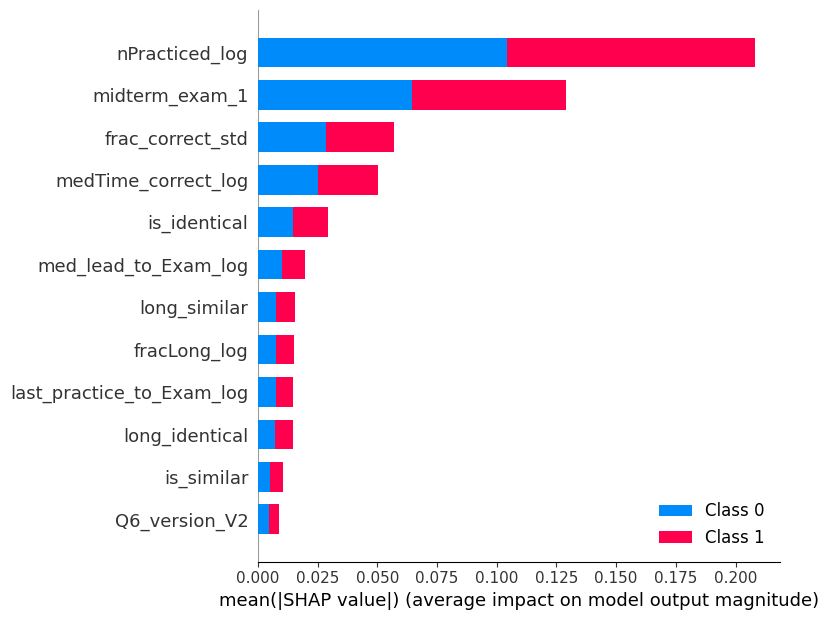

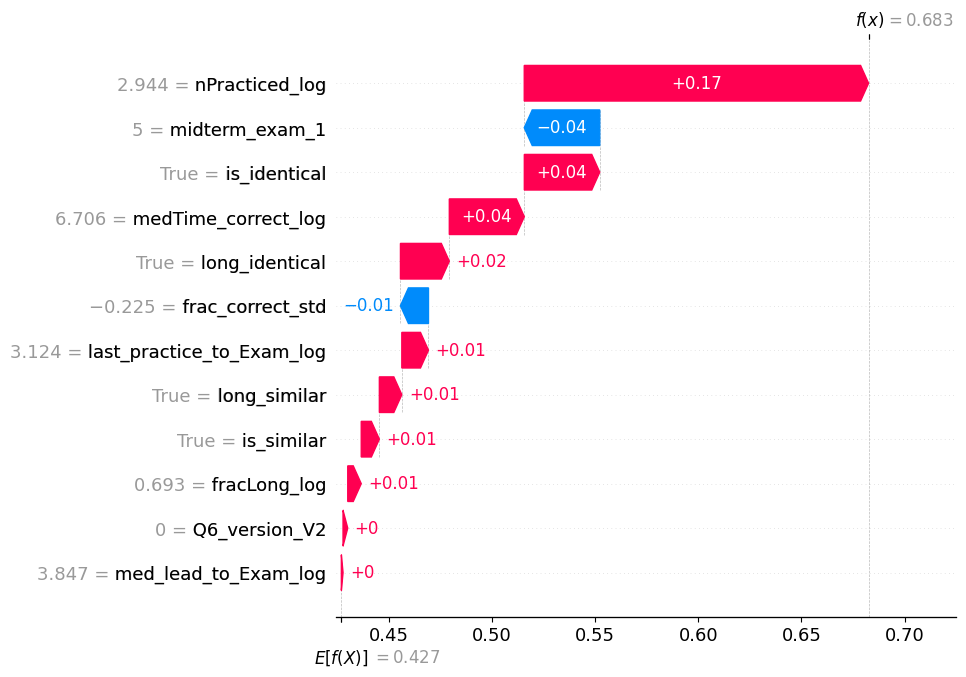

In [17]:
# no final score
# Define the grid of parameters to search
param_grid = {
    'n_estimators': [50, 100, 200, 500, 1000],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2', None],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'bootstrap': [True, False]
}

# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(),
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    verbose=3,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
best_model = grid_search.best_estimator_
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0, :], X_test.iloc[0, :])

# Plot waterfall plot with all features displayed
shap.waterfall_plot(shap.Explanation(values=shap_values[1][0],
                                      base_values=explainer.expected_value[1],
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=len(X_test.columns))

<Figure size 3000x1800 with 0 Axes>

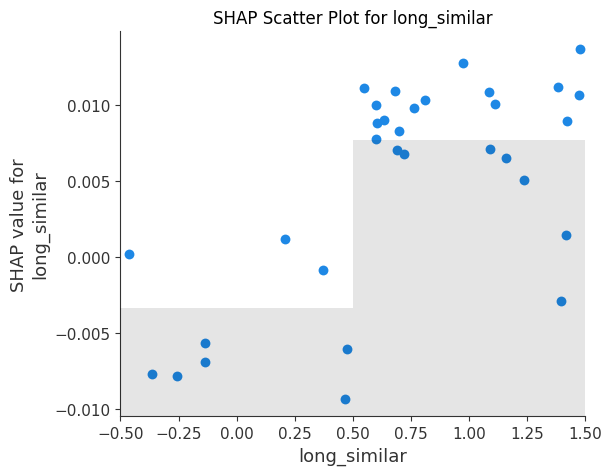

<Figure size 3000x1800 with 0 Axes>

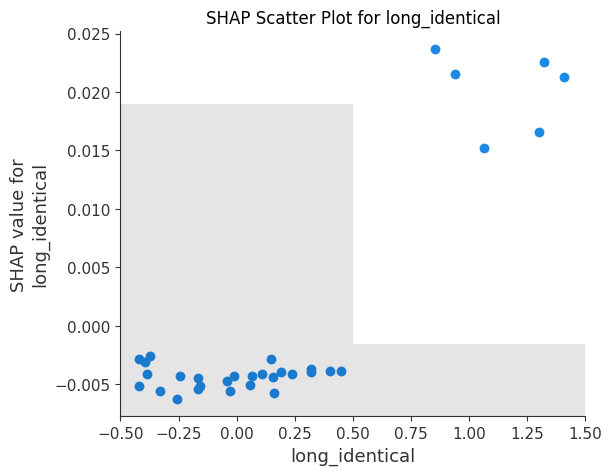

<Figure size 3000x1800 with 0 Axes>

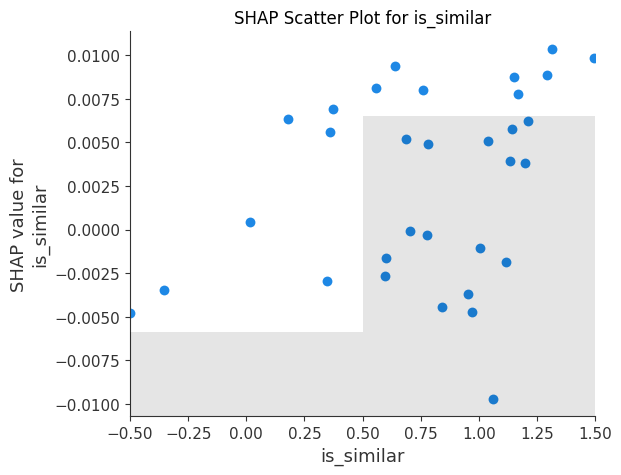

<Figure size 3000x1800 with 0 Axes>

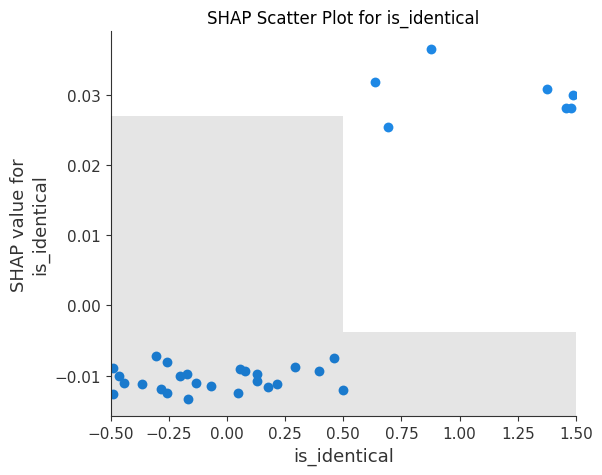

<Figure size 3000x1800 with 0 Axes>

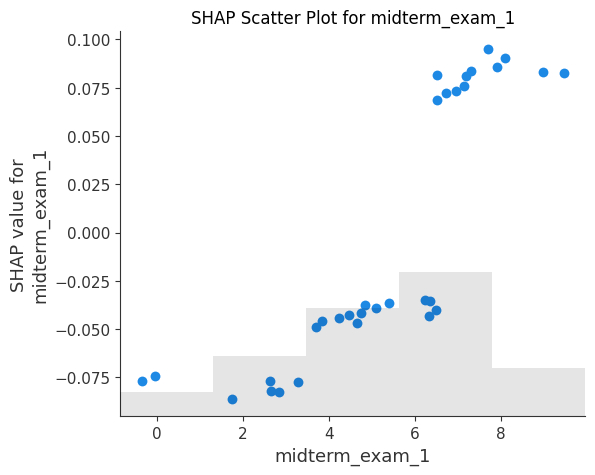

<Figure size 3000x1800 with 0 Axes>

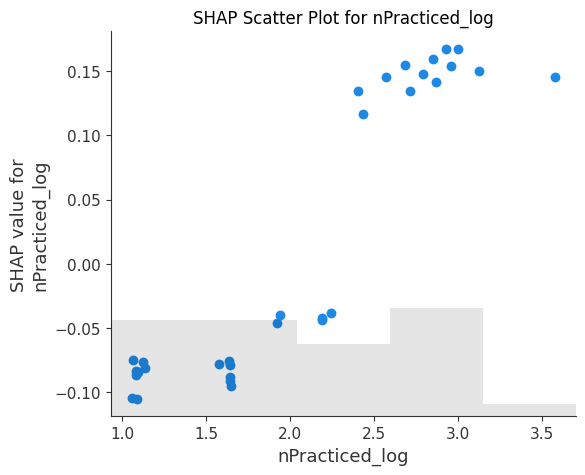

<Figure size 3000x1800 with 0 Axes>

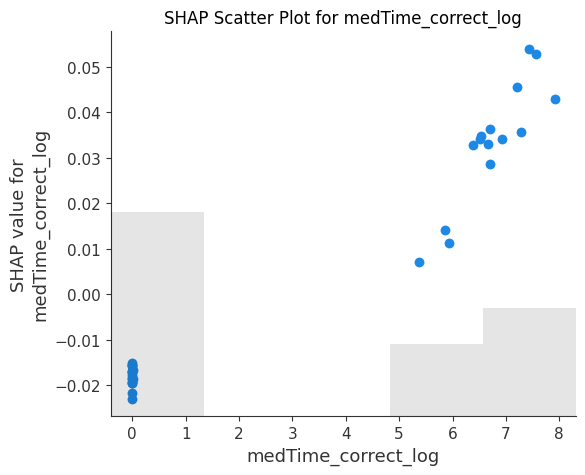

<Figure size 3000x1800 with 0 Axes>

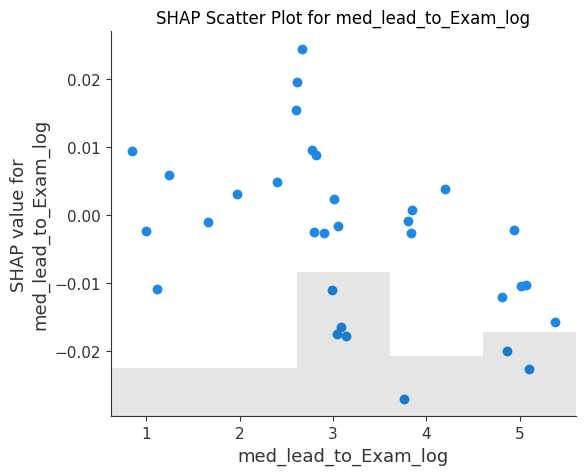

<Figure size 3000x1800 with 0 Axes>

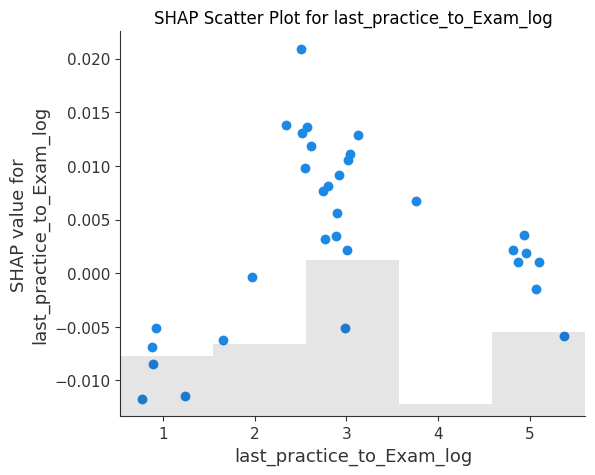

<Figure size 3000x1800 with 0 Axes>

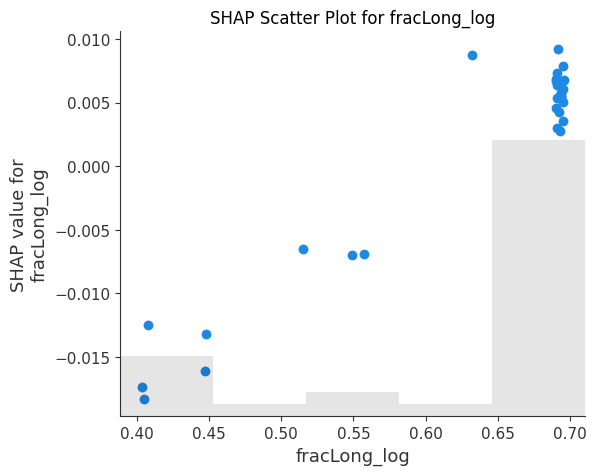

<Figure size 3000x1800 with 0 Axes>

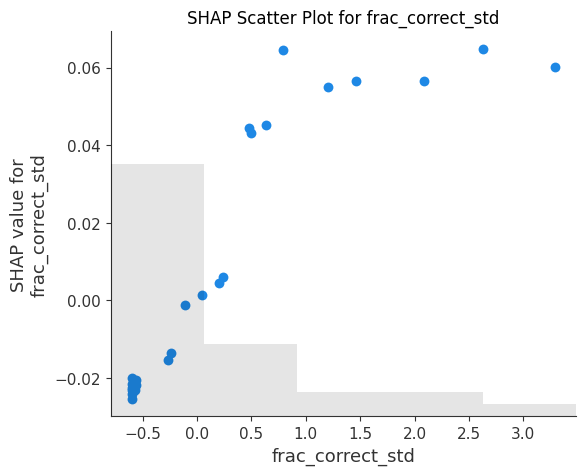

<Figure size 3000x1800 with 0 Axes>

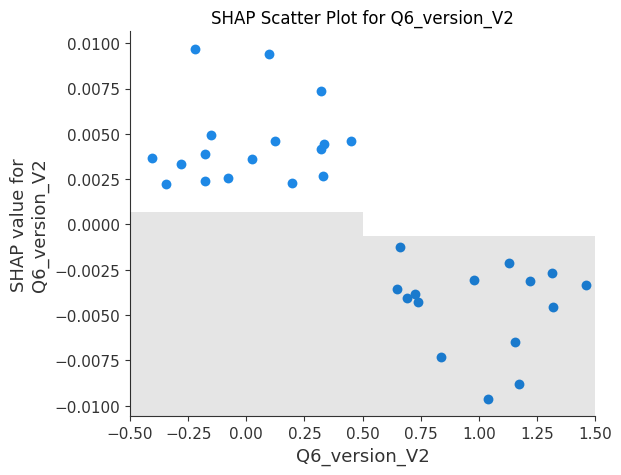

In [19]:
# # Create the Explanation object as you already did
feature_names = X_test.columns.tolist()
explanation = shap.Explanation(
    values=shap_values[1],
    feature_names=feature_names,
    data=X_test.values  # Add the feature data if available
)
# explanation = shap.Explanation(values=shap_values[1][0],
#                                       base_values=explainer.expected_value[1],
#                                       data=X_test.iloc[0],
#                                       feature_names=X_test.columns)

for feature in feature_names:
    # Get the index of the feature
    feature_index = feature_names.index(feature)  # Convert feature name to its index
    
    # Set the size of the plot (width, height) in inches
    plt.figure(figsize=(10, 6), dpi=300)  # Adjust the size as needed
    
    # Create the scatter plot for the specific feature using its index
    shap.plots.scatter(explanation[:, feature_index],dot_size=50,x_jitter=1, show=False)
    
    # Set the plot title
    plt.title(f'SHAP Scatter Plot for {feature}')
    
    # Show the plot
    plt.show()


In [93]:
# Get the index of the feature 'midterm_exam_1'
feature_index = feature_names.index("midterm_exam_1")

# Plot SHAP scatter plot for the feature using Explanation object
shap.plots.scatter(explanation[:, feature_index])

AttributeError: 'list' object has no attribute 'reshape'

In [104]:
shap_values

[array([[-8.31476044e-03, -3.35201535e-02,  1.66165279e-04,
         -3.63562620e-02,  4.47370804e-02, -2.00981019e-01,
         -3.90060093e-02,  3.89745637e-03, -1.17009156e-02,
         -1.55240633e-02, -3.26888740e-03, -1.52521258e-02],
        [ 3.40809378e-04,  6.67366425e-03, -1.34750576e-03,
          9.03471845e-03,  5.41764964e-02,  8.04329579e-02,
          1.59435167e-02,  2.57148472e-02, -1.25908437e-02,
         -1.34058371e-02,  1.88834077e-02,  2.13953417e-02],
        [-4.12455672e-03,  8.17860474e-03,  4.48326422e-03,
          7.81732129e-03,  5.25133842e-02, -1.31822535e-01,
         -3.33619149e-02, -3.97090585e-02, -2.26173948e-02,
         -1.68380122e-02, -1.39021578e-02, -1.53784544e-02],
        [-1.94866308e-03, -3.27117673e-02,  2.88371179e-03,
         -2.94386982e-02,  9.30579790e-02,  4.60364816e-02,
         -4.24968271e-02,  4.72717781e-03,  1.39241256e-02,
         -1.37566454e-02, -4.30759912e-02, -1.89797001e-02],
        [-8.40415153e-03,  1.0334468

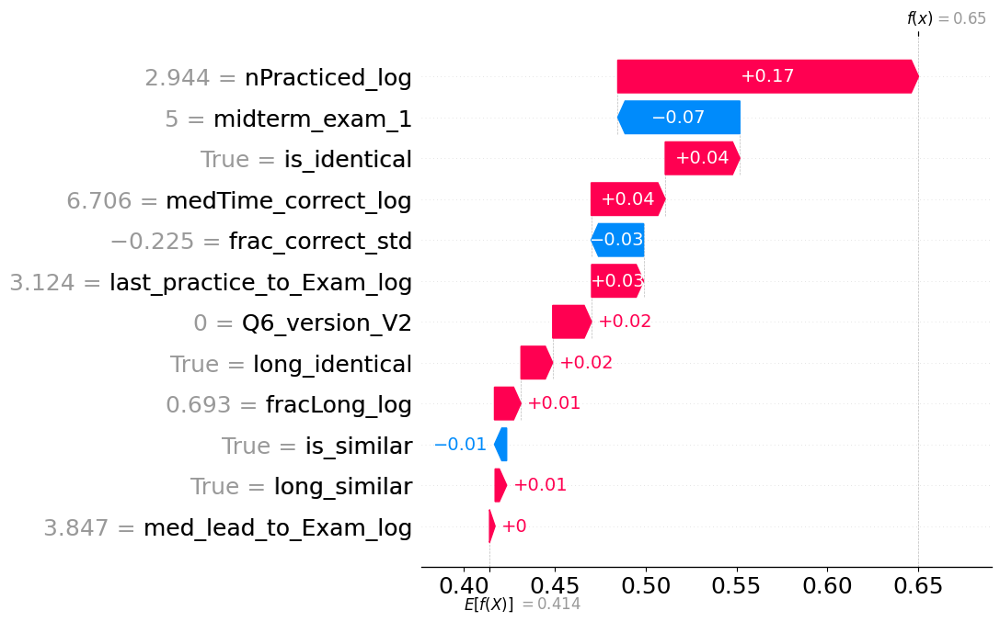

In [8]:
# Access current axes
ax = plt.gca()
# Create the waterfall plot
# shap.waterfall_plot(shap.Explanation(values=shap_values.values[0],
#                                      base_values=explainer.expected_value,
#                                      data=X_test.iloc[0],
#                                      feature_names=X_test.columns),
#                     max_display=len(X_test.columns),
#                     show=False
#                     )
# Plot waterfall plot without limiting the number of displayed features
# shap.plots.waterfall(shap.Explanation(values=shap_values[0],
#                                       base_values=explainer.expected_value,
#                                       data=X_test.iloc[0],
#                                       feature_names=X_test.columns),
#                      max_display=9,
#                      show = False)
# Plot waterfall plot with all features displayed
shap.waterfall_plot(shap.Explanation(values=shap_values[1][0],
                                      base_values=explainer.expected_value[1],
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=len(X_test.columns),
                     show = False)

# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# Show the adjusted plot
plt.show()

## Transfer Data

In [5]:
# Load your data
df_transfer = pd.read_csv('transfer_outcome_data.csv')

# Ensure proper data types
df_transfer['Transfer_outcome'] = df_transfer['Transfer_outcome'].astype('category')
df_transfer['Q6_version'] = df_transfer['Q6_version'].astype('category')

# Convert categorical columns to one-hot encoding
df_transfer = pd.get_dummies(df_transfer, columns=['Q6_version'], drop_first=True)

# Define feature matrix X and target vector y
X_transfer = df_transfer.drop(['Transfer_outcome','course_final_score'], axis=1)
y_transfer = df_transfer['Transfer_outcome'].cat.codes  # Convert categorical outcome to numeric codes

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_transfer, y_transfer, test_size=0.2, random_state=42)


### Logistic Regression

AUC Score for Logistic Regression: 0.6545454545454545


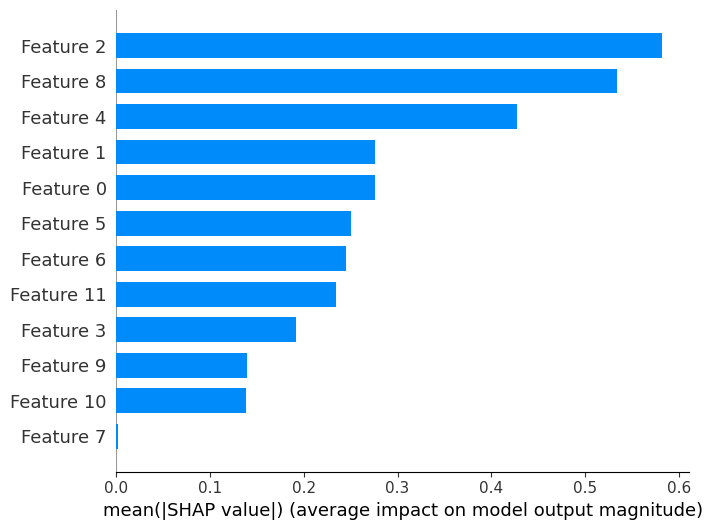

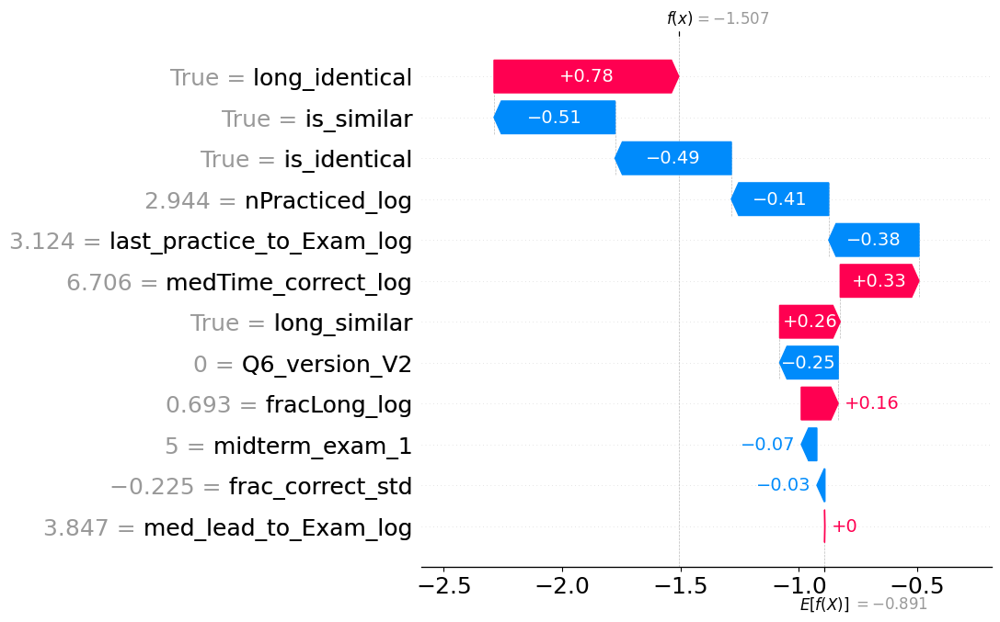

In [48]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 1. Train Logistic Regression Model
log_reg = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
log_reg.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred_log_reg = log_reg.predict_proba(X_test_scaled)[:, 1]
auc_score_log_reg = roc_auc_score(y_test, y_pred_log_reg)
print(f'AUC Score for Logistic Regression: {auc_score_log_reg}')

# SHAP for Logistic Regression
explainer_log_reg = shap.Explainer(log_reg, X_train_scaled)
shap_values_log_reg = explainer_log_reg(X_test_scaled)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_log_reg, X_test, plot_type="bar", title="Logistic Regression SHAP Values")

# Plot SHAP force plot for a single instance
shap.initjs()
shap.force_plot(explainer_log_reg.expected_value, shap_values_log_reg.values[0], X_test.iloc[0])

ax = plt.gca()
# Plot waterfall plot with all features displayed
shap.waterfall_plot(shap.Explanation(values=shap_values_log_reg.values[0],
                                      base_values=explainer_log_reg.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                    max_display=len(X_test.columns),
                    show=False)
# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# Show the adjusted plot
plt.savefig('logistic_transfer_shap_waterfall_onlyexam1.svg', format='svg')
plt.show()

### Random Forest

Fitting 5 folds for each of 54 candidates, totalling 270 fits


[CV 1/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.621 total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.647 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.787 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100;, score=0.654 total time=   0.2s
[CV 2/5] END bootstrap=True, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100;, score=0.784 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100;, score=0.601 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100;, score=0.699 total time=   0.2s
[CV 4/5] END bootstrap=Tru

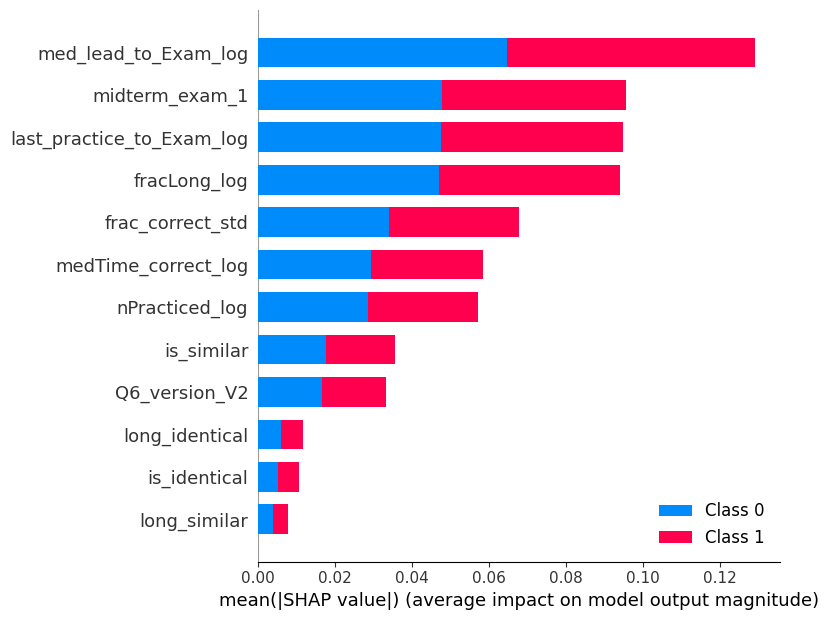

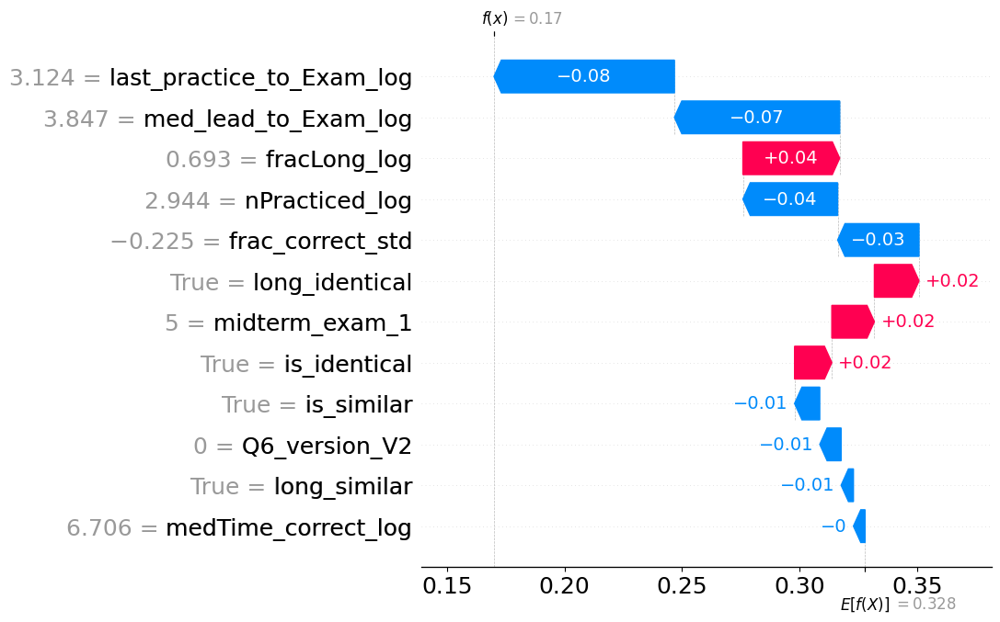

In [14]:
# Define the grid of parameters to search
param_grid = {
    'n_estimators': [100],  # Number of trees in the forest
    'max_features': ['sqrt', 'log2', None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(),
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    verbose=3,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
best_model = grid_search.best_estimator_
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0, :], X_test.iloc[0, :])

ax = plt.gca()
# Plot waterfall plot with all features displayed
shap.waterfall_plot(shap.Explanation(values=shap_values[1][0],
                                      base_values=explainer.expected_value[1],
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=len(X_test.columns),
                     show = False)
# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# Show the adjusted plot
# Show the adjusted plot
plt.savefig('rf_transfer_shap_waterfall_onlyexam1.svg', format='svg')
plt.show()

### XGBoost

Fitting 5 folds for each of 2187 candidates, totalling 10935 fits


[CV 4/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, subsample=0.6;, score=0.618 total time=   0.1s
[CV 3/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=50, subsample=0.8;, score=0.654 total time=   0.1s
[CV 3/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=100, subsample=0.6;, score=0.537 total time=   0.0s
[CV 2/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=50, subsample=0.8;, score=0.804 total time=   0.1s
[CV 2/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=150, subsample=0.8;, score=0.784 total time=   0.1s
[CV 4/5] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=100, subsample=0.6;, score=0.684 total time=   0.0s
[CV 5/5] END colsample_bytree=

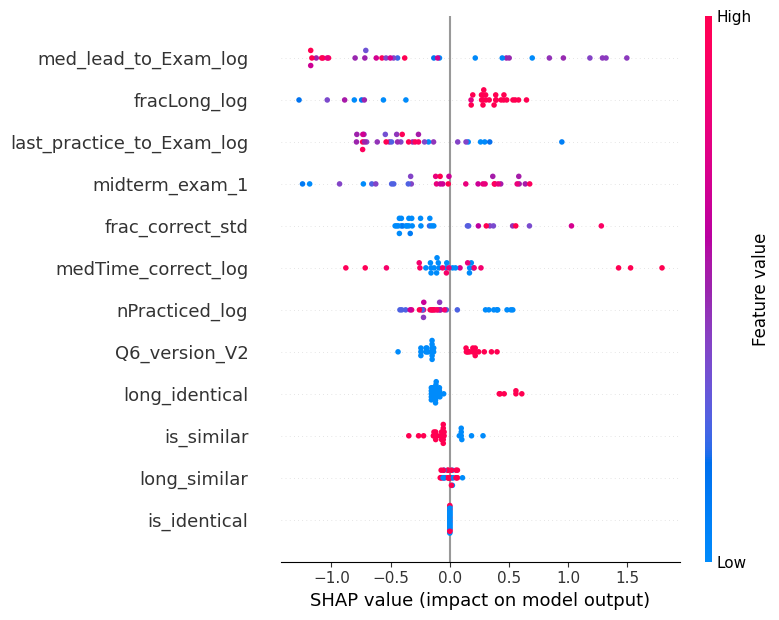

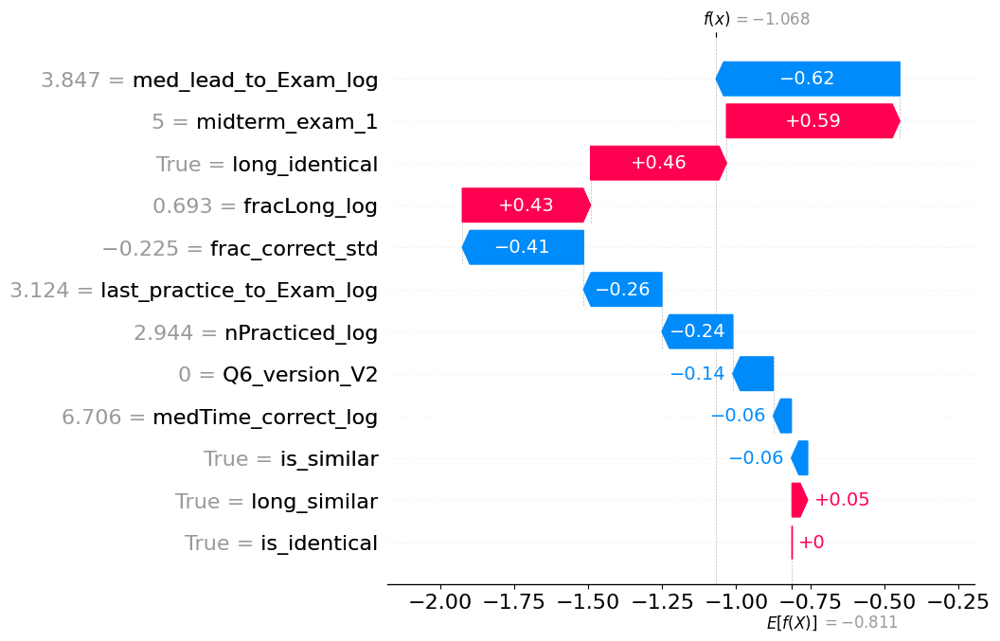

In [6]:
# Define the parameters for the xgboost model
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    nthread=2,
    verbosity=1
)

# Define the grid of parameters to search
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [4, 6, 8],
    'learning_rate': [0.01, 0.1, 0.3],
    'gamma': [0, 1, 5],
    'colsample_bytree': [0.6, 0.8, 1],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1]
}

# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    verbose=3,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
best_model = grid_search.best_estimator_
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# Plot individual SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0, :], X_test.iloc[0, :])

ax = plt.gca()
# Plot waterfall plot without limiting the number of displayed features
shap.plots.waterfall(shap.Explanation(values=shap_values[0],
                                      base_values=explainer.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                     max_display=len(X_test.columns),
                     show = False)
# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(16)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# Show the adjusted plot
plt.savefig('xgb_transfer_shap_waterfall_onlyexam1.svg', format='svg')
plt.show()

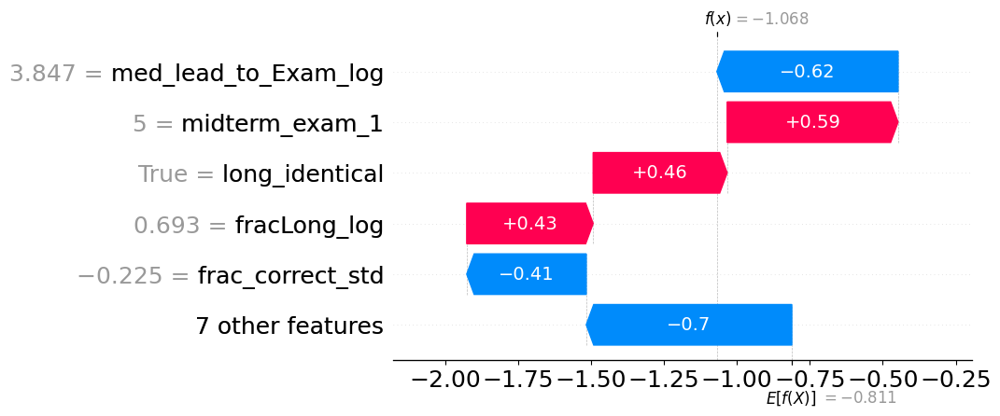

In [14]:
ax = plt.gca()
# Plot waterfall plot without limiting the number of displayed features
shap.plots.waterfall(shap.Explanation(values=shap_values[0],
                                      base_values=explainer.expected_value,
                                      data=X_test.iloc[0],
                                      feature_names=X_test.columns),
                    #  max_display=len(X_test.columns),
                     max_display=6,
                     show = False)
# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(220)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# Show the adjusted plot
plt.savefig('xgb_transfer_shap_waterfall_onlyexam1.svg', format='svg')
plt.show()

<Figure size 1000x600 with 0 Axes>

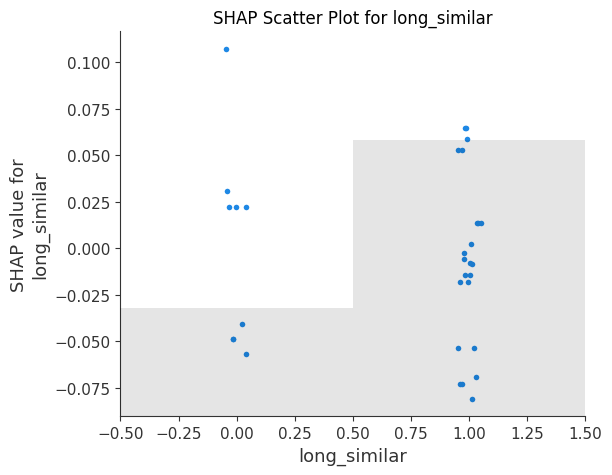

<Figure size 1000x600 with 0 Axes>

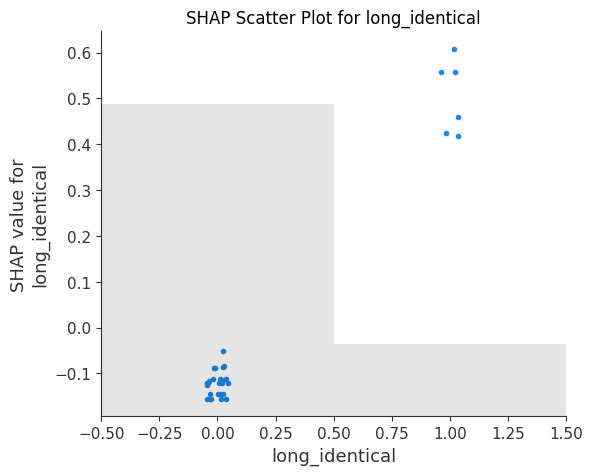

<Figure size 1000x600 with 0 Axes>

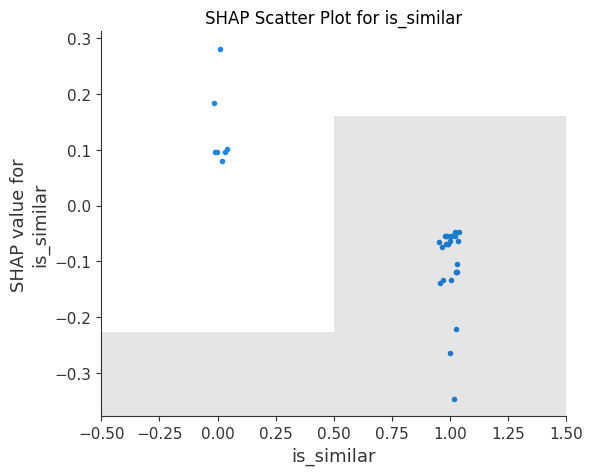

<Figure size 1000x600 with 0 Axes>

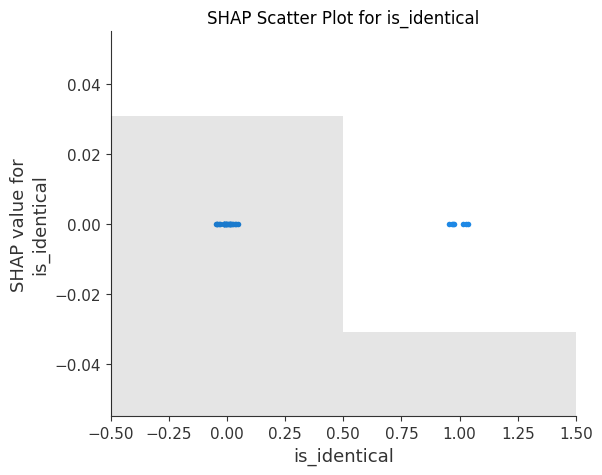

<Figure size 1000x600 with 0 Axes>

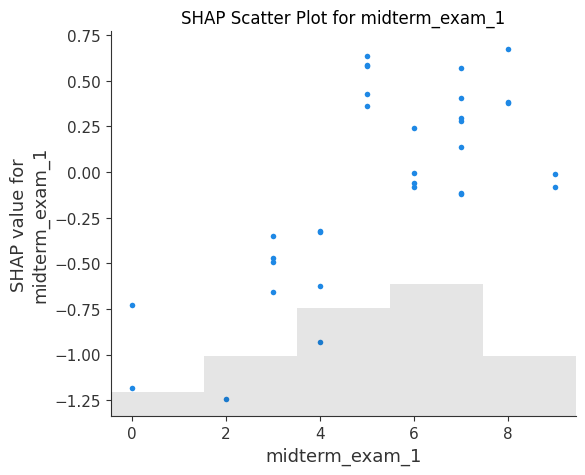

<Figure size 1000x600 with 0 Axes>

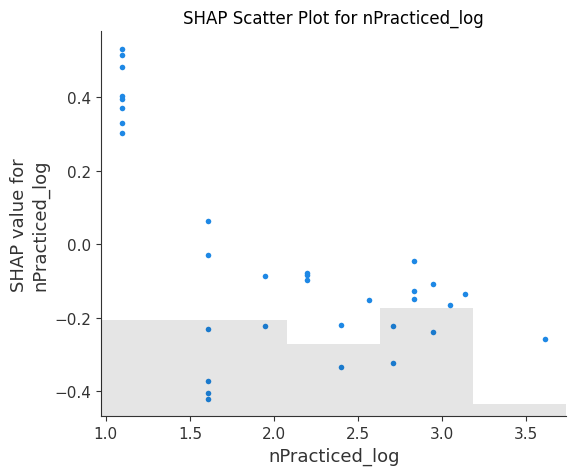

<Figure size 1000x600 with 0 Axes>

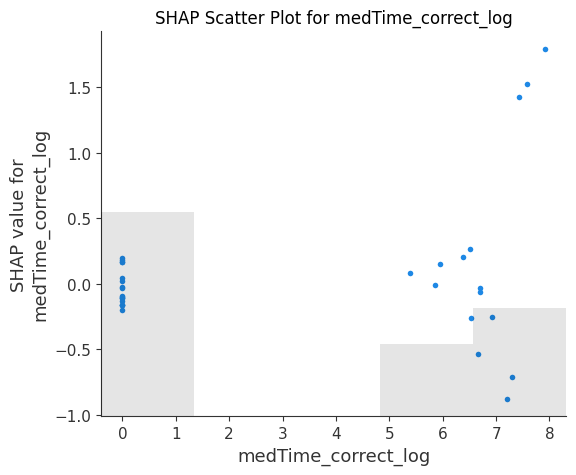

<Figure size 1000x600 with 0 Axes>

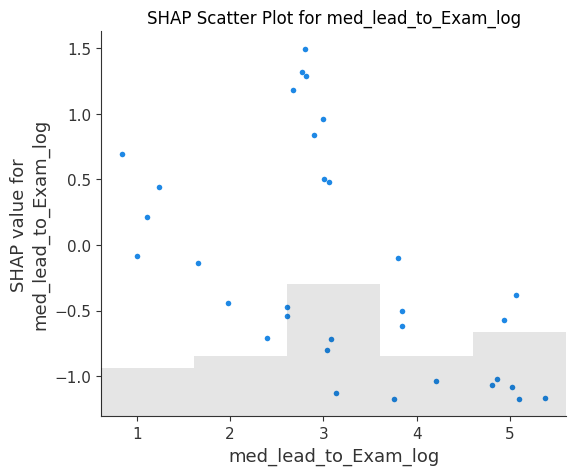

<Figure size 1000x600 with 0 Axes>

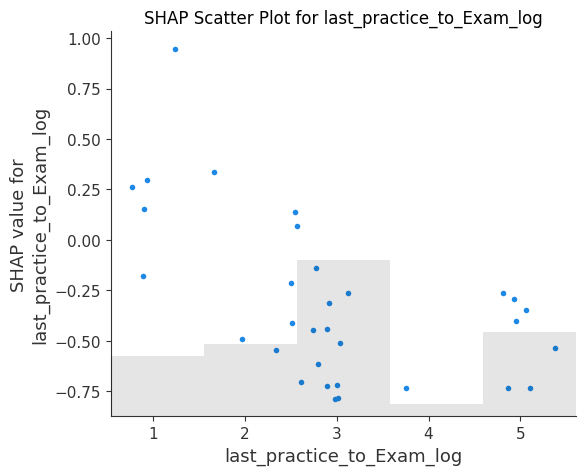

<Figure size 1000x600 with 0 Axes>

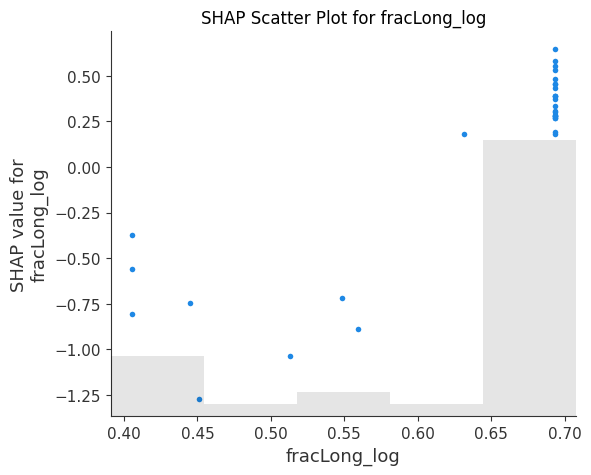

<Figure size 1000x600 with 0 Axes>

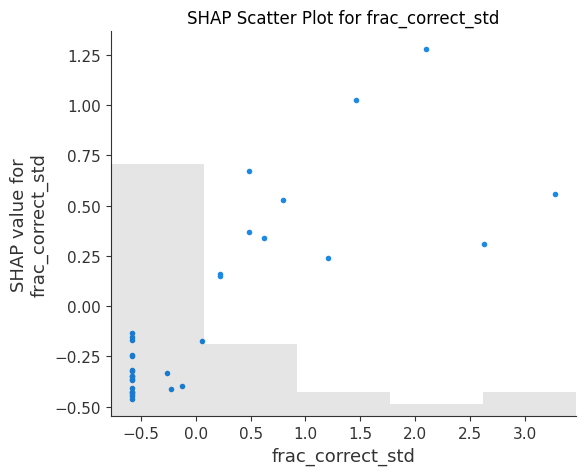

<Figure size 1000x600 with 0 Axes>

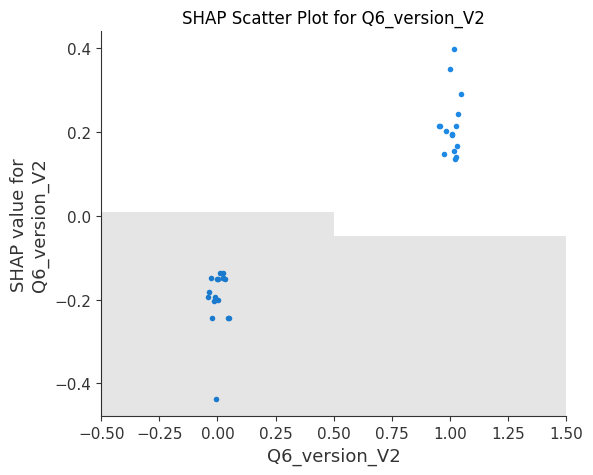

In [44]:
# # shap.TreeExplainer(best_model).shap_interaction_values(X_test["long_identical"])
# shap.plots.scatter(shap.Explanation(values=shap_values[0]),
#                                     #   base_values=explainer.expected_value,
#                                     #   data=X_test.iloc[0],
#                                     #   feature_names=X_test.columns),
#                     #  max_display=len(X_test.columns),
#                     #  max_display=6,
#                      show = False)
# shap.plots.scatter(shap.Explanation(values=shap_values[:, 1], feature_names=X_test.columns))



# Set the size of the plot (width, height) in inches
# plt.figure(figsize=(20000, 10))  # Make the figure wider and taller for better readability

# # Create the Explanation object as you already did
feature_names = X_test.columns.tolist()
explanation = shap.Explanation(
    values=shap_values,
    feature_names=feature_names,
    data=X_test.values  # Add the feature data if available
)

# Assuming `explanation` is already created and contains SHAP values and feature names
feature_names = explanation.feature_names

# Loop through each feature and plot its SHAP values
for feature in feature_names:
    # Set the size of the plot (width, height) in inches
    plt.figure(figsize=(10, 6))  # Adjust the size as needed
    
    # Create the scatter plot for the specific feature
    shap.plots.scatter(explanation[:, feature], show=False)
    
    # Set the plot title
    plt.title(f'SHAP Scatter Plot for {feature}')
    
    # Show the plot
    plt.show()


# # Optionally adjust x-tick labels for readability
# plt.xticks(rotation=45, ha='right')  # Rotate x-tick labels for better visibility

# # Display the plot
# plt.show()



In [53]:
y_test

78     0
155    0
128    1
55     0
94     1
29     1
147    0
51     0
98     1
141    0
19     0
60     0
15     0
65     1
24     0
30     0
126    0
101    0
96     0
16     0
151    1
18     0
12     1
9      0
31     0
125    0
95     1
56     0
145    0
152    1
135    1
76     0
dtype: int8

In [56]:
explainer = shap.TreeExplainer(best_model)

# 2. Calculate SHAP interaction values for all features
shap_interaction_values = explainer.shap_interaction_values(X_test)

# 3. If you only want interaction values for 'long_identical'
feature_index = X_test.columns.get_loc("midterm_exam_1")
midterm_interactions = shap_interaction_values[:, feature_index, :]

# 3. If you only want interaction values for 'long_identical'
feature_index_long = X_test.columns.get_loc("long_identical")
long_identical_interactions = shap_interaction_values[:, feature_index_long, :]

transfer_interaction = shap_interaction_values[:, y_test, :]

# 4. Visualize interactions
# shap.summary_plot(midterm_interactions, transfer_interaction)

# # 5. Get the most important interaction with 'long_identical'
# mean_interactions = np.abs(long_identical_interactions).mean(axis=0)
# most_important_interaction = X_test.columns[np.argmax(mean_interactions)]
# print(f"Most important interaction with 'midterm_exam_1': {most_important_interaction}")

# # 6. Scatter plot of the most important interaction
# # Modified to handle potential indexing issues
shap.dependence_plot(
    ("midterm_exam_1", "transfer_outcome"), 
    shap_interaction_values, 
    X_test,
    feature_names=X_test.columns.tolist()
)

# # Alternative: If the above still doesn't work, try this:
# shap_values = explainer.shap_values(X_test)
# shap.dependence_plot(
#     "midterm_exam_1", 
#     "long_identical", 
#     X_test,
#     interaction_index=most_important_interaction
# )

# # 7. Debug information
# print("Shape of shap_interaction_values:", shap_interaction_values.shape)
# print("Shape of X_test:", X_test.shape)
# print("Columns of X_test:", X_test.columns.tolist())

ValueError: Could not find feature named: transfer_outcome

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

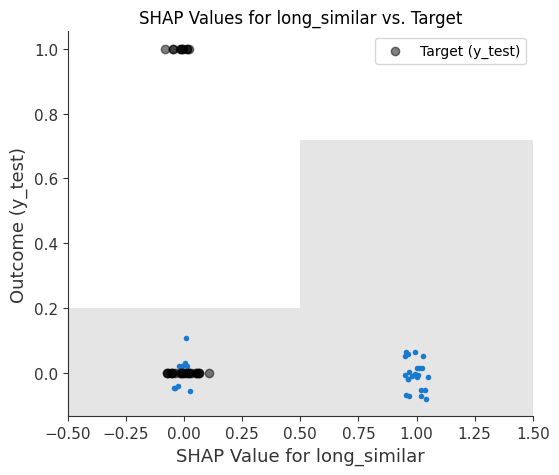

<Figure size 800x600 with 0 Axes>

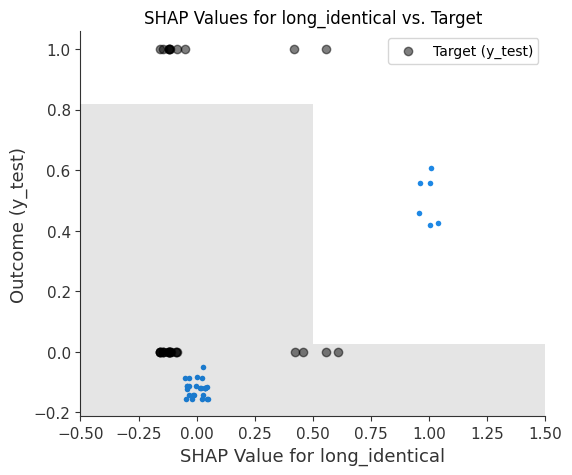

<Figure size 800x600 with 0 Axes>

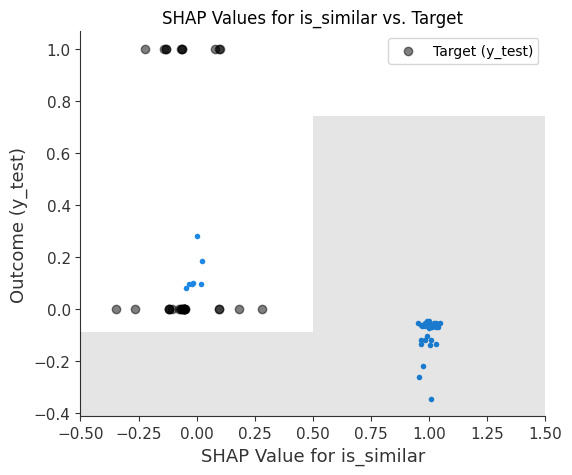

<Figure size 800x600 with 0 Axes>

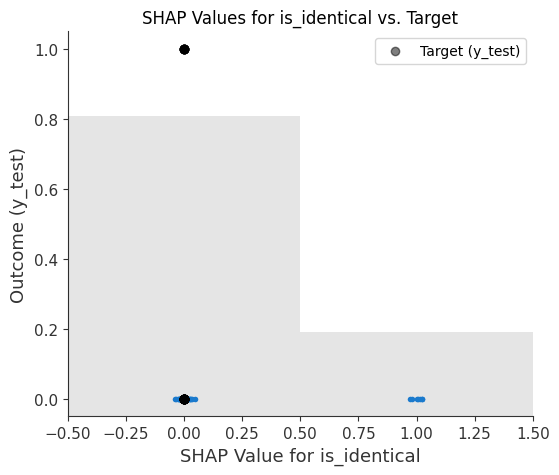

<Figure size 800x600 with 0 Axes>

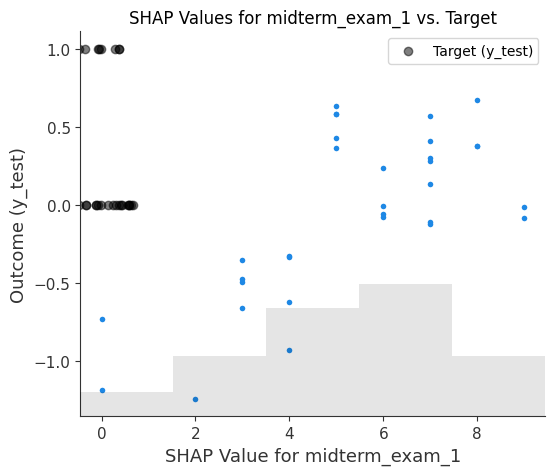

<Figure size 800x600 with 0 Axes>

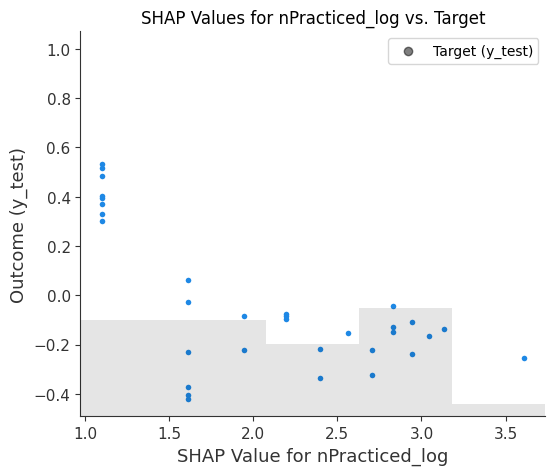

<Figure size 800x600 with 0 Axes>

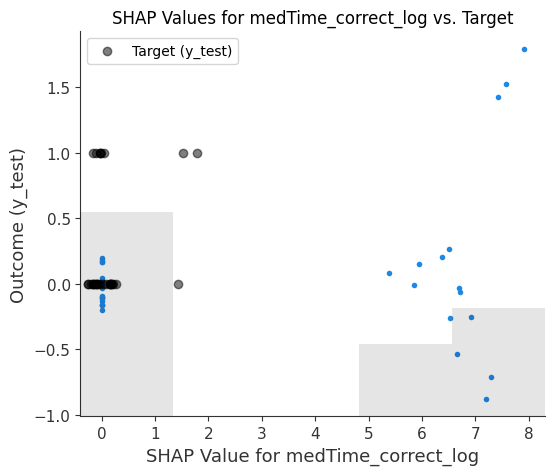

<Figure size 800x600 with 0 Axes>

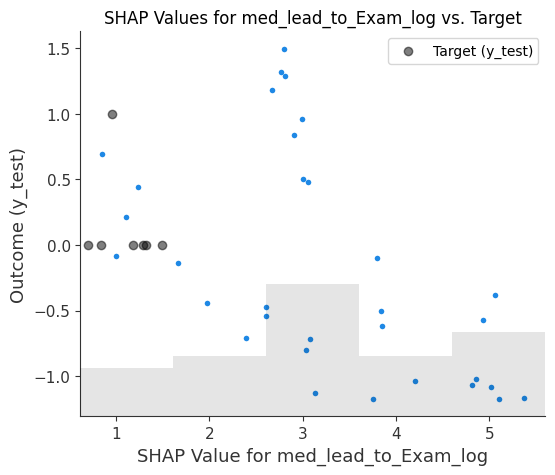

<Figure size 800x600 with 0 Axes>

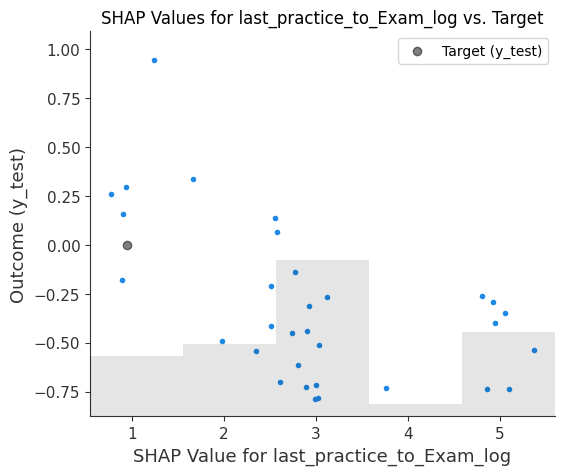

<Figure size 800x600 with 0 Axes>

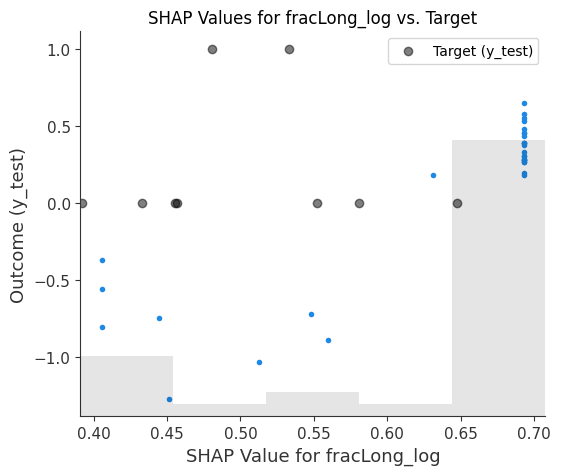

<Figure size 800x600 with 0 Axes>

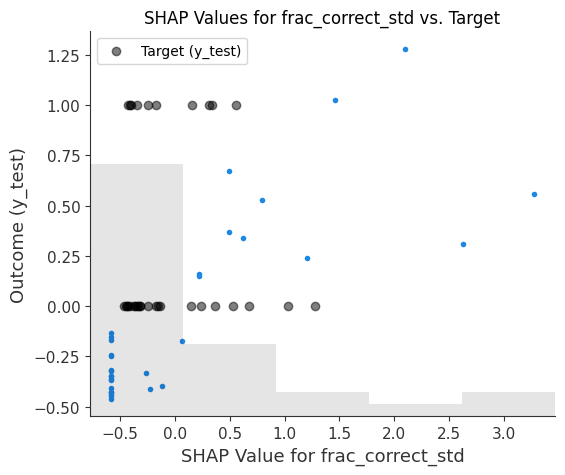

<Figure size 800x600 with 0 Axes>

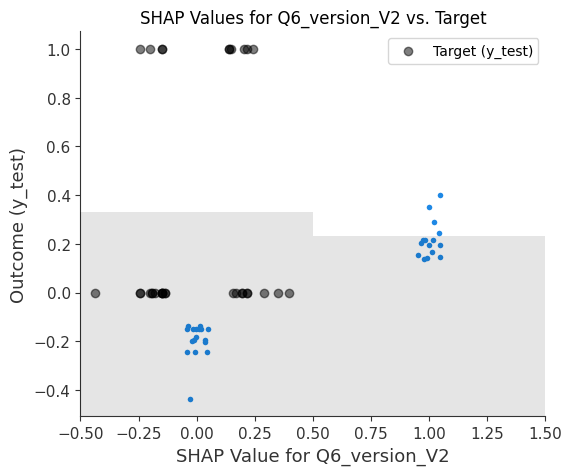

In [62]:
import matplotlib.pyplot as plt
import shap


# Assuming 'model' is your trained model and 'X_test' is the test dataset
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)  # Calculate SHAP values

# Create a SHAP Explanation object
explanation = shap.Explanation(
    values=shap_values,  # SHAP values
    base_values=explainer.expected_value,  # Model's expected value
    data=X_test.values,  # Feature values
    feature_names=X_test.columns.tolist()  # Feature names
)

# Loop through each feature
import matplotlib.pyplot as plt
import shap

# Loop through each feature in X_test
for feature in X_test.columns:
    plt.figure(figsize=(8, 6))  # Set the figure size
    
    # Scatter plot using SHAP's Explanation object
    shap.plots.scatter(explanation[:, feature], show=False)  # Plot SHAP values vs. feature values
    
    # Overlay y_test values on the SHAP scatter plot
    plt.scatter(explanation[:, feature].values, y_test, color='black', alpha=0.5, label='Target (y_test)')
    
    # Set the plot title and labels
    plt.title(f'SHAP Values for {feature} vs. Target')
    plt.xlabel(f'SHAP Value for {feature}')
    plt.ylabel('Outcome (y_test)')
    plt.legend()
    
    # Display the plot
    plt.show()



### CART

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best parameters found:  {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 2}
Best AUC score:  0.6950980392156862
AUC Score on test set: 0.55


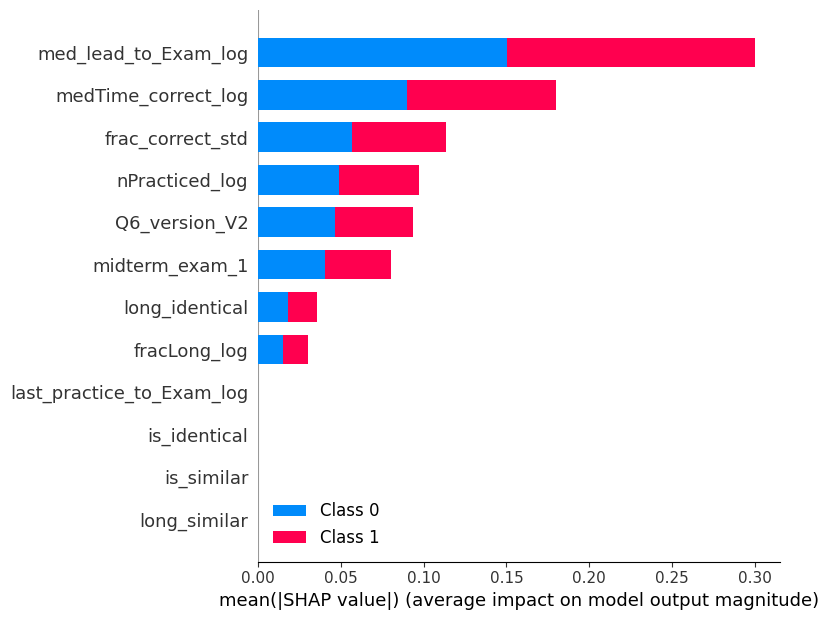

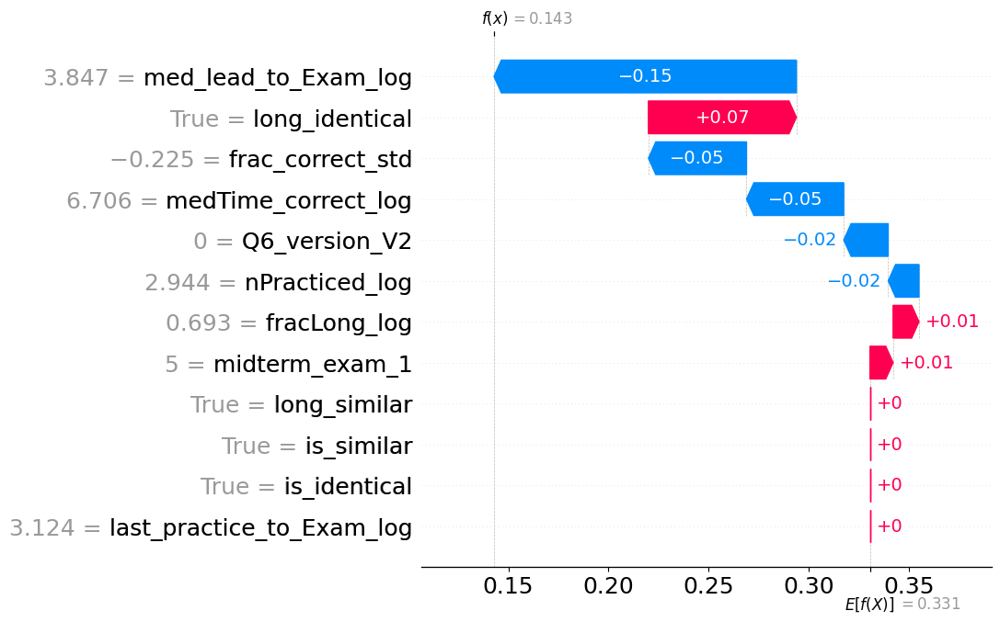

In [20]:
# Define the parameters for the CART model
from sklearn.tree import DecisionTreeClassifier
cart_model = DecisionTreeClassifier(random_state=42)

# Define the grid of parameters to search
# Define the parameter grid for tuning
param_grid = {
    'criterion': ['gini', 'entropy'],  # Split quality criteria
    'max_depth': [None, 5, 10, 15, 20],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 5, 10]  # Minimum number of samples required to be at a leaf node
}


# Define the scoring method
scorer = make_scorer(roc_auc_score, needs_proba=True)

# Perform grid search
grid_search = GridSearchCV(
    estimator=cart_model,
    param_grid=param_grid,
    scoring='roc_auc',  # Optimize for AUC
    cv=5,  # 5-fold cross-validation
    verbose=1,
    n_jobs=-1  # Use all available cores
)


# Fit the model
grid_search.fit(X_train, y_train)

# Print best parameters and AUC score on the test set
best_cart_model = grid_search.best_estimator_
print("Best parameters found: ", grid_search.best_params_)
print("Best AUC score: ", grid_search.best_score_)

# Make predictions on the test set
y_pred = grid_search.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_pred)
print(f'AUC Score on test set: {auc_score}')

# Initialize the SHAP explainer
explainer = shap.TreeExplainer(best_cart_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Plot summary plot
shap.summary_plot(shap_values, X_test)

# # Plot individual SHAP values
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[0, :], X_test.iloc[0, :])

ax = plt.gca()
# Plot waterfall plot without limiting the number of displayed features
instance_index = 0  # Specify the instance you want to plot

shap.plots.waterfall(
    shap.Explanation(values=shap_values[1][instance_index],  # Use shap_values[1] for the positive class
                     base_values=explainer.expected_value[1],  # Use expected value for the positive class
                     data=X_test.iloc[instance_index],  # The data for the instance
                     feature_names=X_test.columns),  # The feature names
    max_display=len(X_test.columns),  # Display all features
    show=False  # Don't show immediately to allow for further customization
)

# shap.plots.waterfall(shap.Explanation(values=shap_values[0,:],
#                                       base_values=explainer.expected_value,
#                                       data=X_test.iloc[0],
#                                       feature_names=X_test.columns),
#                      max_display=len(X_test.columns),
#                      show = False)
# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# # Show the adjusted plot
# plt.savefig('xgb_transfer_shap_waterfall_onlyexam1.svg', format='svg')
plt.show()

In [1]:

ax = plt.gca()
# Plot waterfall plot without limiting the number of displayed features
instance_index = 0  # Specify the instance you want to plot

shap.plots.waterfall(
    shap.Explanation(values=shap_values[1][instance_index],  # Use shap_values[1] for the positive class
                     base_values=explainer.expected_value[1],  # Use expected value for the positive class
                     data=X_test.iloc[instance_index],  # The data for the instance
                     feature_names=X_test.columns),  # The feature names
    max_display=len(X_test.columns),  # Display all features
    show=False  # Don't show immediately to allow for further customization
)

# shap.plots.waterfall(shap.Explanation(values=shap_values[0,:],
#                                       base_values=explainer.expected_value,
#                                       data=X_test.iloc[0],
#                                       feature_names=X_test.columns),
#                      max_display=len(X_test.columns),
#                      show = False)
# Set font size for all text elements in the plot
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(18)  # Adjust the font size here
for annotation in ax.texts:
    annotation.set_fontsize(14)
for text in ax.texts:
    if 'f(x)' in text.get_text():  # Check if the text is 'f(x)' or contains 'f(x)'
        text.set_fontsize(20)  # Adjust font size (increase the number as needed)
        text.set_fontweight('bold')  # Optional: make the text bold

# # Show the adjusted plot
# plt.savefig('xgb_transfer_shap_waterfall_onlyexam1.svg', format='svg')
plt.show()

NameError: name 'plt' is not defined